In [3]:
import sys
path = r"/Users/constantinslioussarenko/PythonGitRepositories/MyoMap"
path = r"/home/cslioussarenko/PythonRepositories"
sys.path.append(path+"/epgpy")
sys.path.append(path+"/machines")
sys.path.append(path+"/mutools")
sys.path.append(path+"/dicomstack")
sys.path.append(path+"/mrf-sim")

#import matplotlib
#matplotlib.use("TkAgg")
from mrfsim import T1MRF
from image_series import *
from dictoptimizers import SimpleDictSearch
from utils_mrf import *
import json
import readTwix as rT
import time
import os
from numpy.lib.format import open_memmap
from numpy import memmap
import pickle

base_folder = "../data/InVivo/3D"
localfile = "/20220106_JM/meas_MID00180_FID48490_raFin_3D_tra_1x1x5mm_FULL_new.dat"
localfile = "/20220113_CS/meas_MID00163_FID49558_raFin_3D_tra_1x1x5mm_FULL_50GS_read.dat"
#localfile = "/20220113_CS/meas_MID00164_FID49559_raFin_3D_tra_1x1x5mm_FULL_50GS_slice.dat"


import twixtools
%matplotlib inline

In [4]:
filename = base_folder+localfile

#filename="./data/InVivo/3D/20211221_EV_MRF/meas_MID00043_FID42065_raFin_3D_tra_1x1x5mm_us2_vivo.dat"
#filename="./data/InVivo/3D/20211119_EV_MRF/meas_MID00043_FID42065_raFin_3D_tra_1x1x5mm_us2_vivo.dat"
#filename="./data/InVivo/3D/20211119_EV_MRF/meas_MID00043_FID42065_raFin_3D_tra_1x1x5mm_us2_vivo.dat"

filename_save=str.split(filename,".dat") [0]+".npy"
filename_nav_save=str.split(filename,".dat") [0]+"_nav.npy"

folder = "/".join(str.split(filename,"/")[:-1])


filename_b1 = str.split(filename,".dat") [0]+"_b1.npy"
filename_seqParams = str.split(filename,".dat") [0]+"_seqParams.pkl"

filename_volume = str.split(filename,".dat") [0]+"_volumes.npy"
filename_kdata = str.split(filename,".dat") [0]+"_kdata.npy"
filename_mask= str.split(filename,".dat") [0]+"_mask.npy"


In [5]:

use_GPU = False
light_memory_usage=True

In [6]:
file = open(filename_seqParams, "rb")
dico_seqParams = pickle.load(file)
file.close()


In [7]:
use_navigator_dll=dico_seqParams["use_navigator_dll"]

if use_navigator_dll:
    meas_sampling_mode=dico_seqParams["alFree"][14]
    nb_gating_spokes = dico_seqParams["alFree"][6]
else:
    meas_sampling_mode = dico_seqParams["alFree"][12]
    nb_gating_spokes = 0

if nb_gating_spokes>0:
    meas_orientation =  dico_seqParams["alFree"][11]
    if meas_orientation==1:
        nav_direction = "READ"
    elif meas_orientation==2:
        nav_direction = "PHASE"
    elif meas_orientation==3:
        nav_direction = "SLICE"

nb_segments = dico_seqParams["alFree"][4]

x_FOV = dico_seqParams["x_FOV"]
y_FOV = dico_seqParams["y_FOV"]
z_FOV = dico_seqParams["z_FOV"]
nb_part = dico_seqParams["nb_part"]

In [8]:
nb_allspokes=nb_segments
undersampling_factor=1

In [9]:
data_for_nav=np.load(filename_nav_save)

In [10]:
data_for_nav.shape

(34, 48, 50, 800)

In [11]:
npoint = data_for_nav.shape[-1]
nb_slices=data_for_nav.shape[1]
nb_channels=data_for_nav.shape[0]

In [13]:
all_timesteps = np.arange(nb_allspokes)
nav_timesteps=all_timesteps[::int(nb_allspokes/nb_gating_spokes)]

nav_traj=Navigator3D(direction=[0,0,1],npoint=npoint,nb_slices=nb_slices,applied_timesteps=list(nav_timesteps))
#test_traj = nav_traj.get_traj()

nav_image_size = (int(npoint/2),)

In [15]:
def calculate_sensitivity_map_3D_for_nav(kdata,trajectory,res=16,image_size=(400,)):
    traj=trajectory.get_traj()
    nb_channels=kdata.shape[0]
    npoint=kdata.shape[-1]
    nb_slices=kdata.shape[1]
    nb_gating_spokes=kdata.shape[2]
    center_res = int(npoint / 2 - 1)
    kdata=kdata.reshape((nb_channels,-1,npoint))
    b1_nav=np.zeros((nb_channels,kdata.shape[1],)+nav_image_size,dtype=np.complex128)
    kdata_for_sensi = np.zeros(kdata.shape[1:], dtype=np.complex128)
    for i in tqdm(range(nb_channels)):
        kdata_for_sensi[:, (center_res - int(res / 2)):(center_res + int(res / 2))] = kdata[i,:,(center_res - int(res / 2)):(center_res + int(res / 2))]
        b1_nav[i] = finufft.nufft1d1(traj[0,:,2], kdata_for_sensi, image_size)

        print("Normalizing sensi")

        #b1 = coil_sensitivity / np.linalg.norm(coil_sensitivity, axis=0)
        #del coil_sensitivity
        #b1 = b1 / np.max(np.abs(b1.flatten()))
    b1_nav /= np.linalg.norm(b1_nav, axis=0)
    b1_nav /= np.max(np.abs(b1_nav.flatten()))

    b1_nav=b1_nav.reshape((nb_channels,nb_slices,nb_gating_spokes,int(npoint/2)))
    return b1_nav

    

In [16]:
b1_nav = calculate_sensitivity_map_3D_for_nav(data_for_nav,nav_traj,res=16,image_size=nav_image_size)

 12%|█▏        | 4/34 [00:00<00:02, 14.11it/s]

Normalizing sensi
Normalizing sensi
Normalizing sensi
Normalizing sensi


 24%|██▎       | 8/34 [00:00<00:01, 15.06it/s]

Normalizing sensi
Normalizing sensi
Normalizing sensi
Normalizing sensi


 35%|███▌      | 12/34 [00:00<00:01, 15.49it/s]

Normalizing sensi
Normalizing sensi
Normalizing sensi
Normalizing sensi


 47%|████▋     | 16/34 [00:01<00:01, 15.51it/s]

Normalizing sensi
Normalizing sensi
Normalizing sensi
Normalizing sensi


 59%|█████▉    | 20/34 [00:01<00:00, 15.58it/s]

Normalizing sensi
Normalizing sensi
Normalizing sensi
Normalizing sensi


 71%|███████   | 24/34 [00:01<00:00, 15.71it/s]

Normalizing sensi
Normalizing sensi
Normalizing sensi
Normalizing sensi


 82%|████████▏ | 28/34 [00:01<00:00, 15.79it/s]

Normalizing sensi
Normalizing sensi
Normalizing sensi
Normalizing sensi


 94%|█████████▍| 32/34 [00:02<00:00, 15.60it/s]

Normalizing sensi
Normalizing sensi
Normalizing sensi
Normalizing sensi


100%|██████████| 34/34 [00:02<00:00, 15.40it/s]


Normalizing sensi
Normalizing sensi


In [17]:
b1_nav.shape

/home/cslioussarenko/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(34, 48, 50, 400)

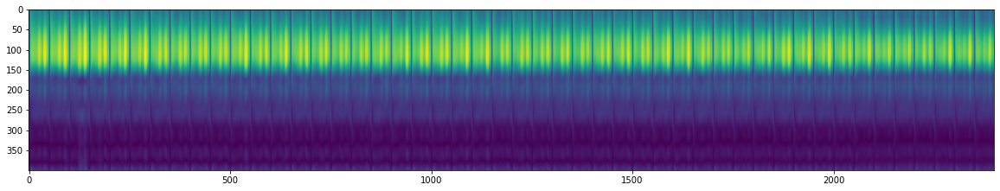

In [18]:
ch=0
plt.figure(figsize=(20,30))
plt.imshow(np.abs(np.expand_dims(b1_nav[ch].reshape(-1,int(npoint/2)).T,axis=-1)))

In [19]:
nav_image_size

/home/cslioussarenko/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(400,)

In [1266]:
b1_nav_0 = b1[:,0,0,:]
b1_nav_mean=np.mean(b1,axis=(1,2))

In [1267]:
b1_nav_mean.shape

(34, 400)

In [1258]:
def simulate_nav_images_multi(kdata,trajectory,image_size=(400,),b1=None):
    traj=trajectory.get_traj()
    nb_channels=kdata.shape[0]
    npoint=kdata.shape[-1]
    nb_slices=kdata.shape[1]
    nb_gating_spokes=kdata.shape[2]
    
    if b1.ndim==2:
        b1=np.expand_dims(b1,axis=(1,2))
    elif b1.ndim==3:
        b1=np.expand_dims(b1,axis==(1))
    
    traj=traj.astype(np.float32)
    
    kdata=kdata.reshape((nb_channels,-1,npoint))
    images_series_rebuilt_nav = np.zeros((nb_slices,nb_gating_spokes,int(npoint/2)),dtype=np.complex64)
    #all_channels_images_nav = np.zeros((nb_channels,nb_slices,nb_gating_spokes,int(npoint/2)),dtype=np.complex64)

    for i in tqdm(range(nb_channels)):
        fk = finufft.nufft1d1(traj[0,:,2], kdata[i, :, :], image_size)
        fk = fk.reshape((nb_slices,nb_gating_spokes,int(npoint/2)))

        #all_channels_images_nav[i]=fk

        if b1 is None:
            images_series_rebuilt_nav += np.abs(fk) ** 2
        else:
            images_series_rebuilt_nav += b1[i].conj() *fk

    if b1 is None:
        images_series_rebuilt_nav = np.sqrt(images_series_rebuilt_nav)
    
    return images_series_rebuilt_nav

In [1254]:
b1.shape

(34, 48, 50, 400)

In [1268]:
images_series_rebuilt_nav=simulate_nav_images_multi(data_for_nav,nav_traj,nav_image_size,b1_nav_mean)

100%|███████████████████████████████████████████| 34/34 [00:05<00:00,  5.69it/s]


In [780]:
np.digitize(np.arange(0,8*175*nb_part,1),np.arange(0,nb_segments*nb_part,nb_segments/nb_gating_spokes))

array([   1,    1,    1, ..., 2400, 2400, 2400])

In [ ]:
np.absnp.arange(8,8*175*nb_part+8,8).reshape(-1,1)-np.arange(0,nb_segments*nb_part,nb_segments/nb_gating_spokes).reshape(1,-1)

In [1269]:
metric=np.abs
image_nav = metric(images_series_rebuilt_nav)

image_nav_demod = image_nav-np.expand_dims(image_nav[0,:,:],axis=0)

mean = np.mean(image_nav,axis=0)
image_nav_centered = image_nav-np.expand_dims(mean,axis=0)

b1 None

In [26]:
def calculate_displacement_from_nav_images(image_nav,bottom=50,top=250,shifts=list(range(-10,10))):
    
    nb_gating_spokes=image_nav.shape[1]
    nb_slices = image_nav.shape[0]
    
    npoint_image= image_nav.shape[-1]
    image_nav_for_correl=image_nav.reshape(-1,npoint_image)
    nb_images=image_nav_for_correl.shape[0]
    correls=[]
    for j in tqdm(range(nb_images-1)):
        corrs=np.zeros(len(shifts))
        if (j+1)%nb_gating_spokes==0:
            for i,shift in enumerate(shifts):
                corr=np.corrcoef(np.concatenate([image_nav_for_correl[0,bottom:top].reshape(1,-1),image_nav_for_correl[j+1,bottom+shift:top+shift].reshape(1,-1)],axis=0))[0,1]
                corrs[i]=corr
        else:
            for i,shift in enumerate(shifts):
                corr=np.corrcoef(np.concatenate([image_nav_for_correl[j,bottom:top].reshape(1,-1),image_nav_for_correl[j+1,bottom+shift:top+shift].reshape(1,-1)],axis=0))[0,1]
                corrs[i]=corr
        correls.append(corrs)

    correls_array=np.array(correls)
    mvt=[shifts[i] for i in np.argmax(correls_array,axis=-1)]
    mvt=np.array(mvt)
    mvt=np.concatenate([[0],mvt])
    mvt=mvt.reshape(int(nb_part),int(nb_gating_spokes))
    displacement=-np.cumsum(mvt,axis=-1).flatten()
    return displacement

/home/cslioussarenko/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [1214]:
image_nav_all_channels=[]
for j in range(nb_channels):
    images_series_rebuilt_nav_ch = simulate_nav_images_multi(np.expand_dims(data_for_nav[j],axis=0), nav_traj, nav_image_size, b1=None)
    image_nav_ch = np.abs(images_series_rebuilt_nav_ch)
    # plt.figure()
    #plt.imshow(image_nav_ch.reshape(-1, int(npoint / 2)).T, cmap="gray")
    #plt.title("Image channel {}".format(j))
    image_nav_all_channels.append(image_nav_ch)
#plt.close("all")
image_nav_all_channels=np.array(image_nav_all_channels)
image_nav_best_channel = image_nav_all_channels[1]

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.72it/s]


Text(0.5, 1.0, 'Image best channel')

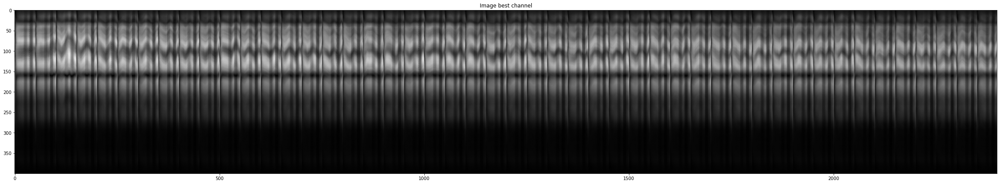

In [1215]:
plt.figure(figsize=(40,10))
plt.imshow(image_nav_best_channel.reshape(-1, int(npoint / 2)).T, cmap="gray")
plt.title("Image best channel")

    

In [932]:
image_nav_best_channel_centered = image_nav_best_channel - np.expand_dims(np.mean(image_nav_best_channel, axis=0),axis=0)
image_nav_best_channel_demod=image_nav_best_channel-np.expand_dims(image_nav_best_channel[0, :, :], axis=0)
image_nav_best_channel_demod_diff = np.diff(image_nav_best_channel_demod,axis=-1)

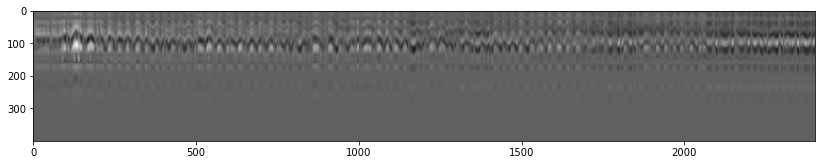

In [936]:
plt.figure(figsize=(14,10))
plt.imshow(image_nav_best_channel_centered.reshape(-1,int(npoint/2)).T,cmap="gray")

In [801]:
index_max_diff=np.argsort(np.abs(np.diff(np.mean(image_nav_best_channel, axis=-1).flatten()[:nb_gating_spokes])))[::-1]

In [1074]:
N=5
image_nav_best_channel_padded = np.pad(image_nav_best_channel, ((0,0),(0,0),(N//2, N-1-N//2)), mode='edge')
image_nav_best_channel_smooth = np.apply_along_axis(lambda m: np.convolve(m, np.ones((N,))/N, mode='valid'), axis=-1, arr=image_nav_best_channel_padded) 

In [910]:
image_nav_best_channel_smooth.shape

(48, 50, 400)

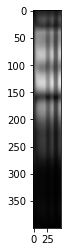

In [930]:
plt.imshow(np.mean(image_nav_best_channel,axis=0).T,cmap="gray")

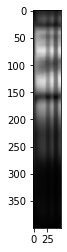

In [931]:
plt.imshow(image_nav_best_channel[0].T,cmap="gray")

In [1021]:
bottom=50
top=150
shifts=list(range(-20,20))
image=image_nav_best_channel_centered
#image=image_nav_centered
image=image_nav_best_channel

In [1023]:


nb_gating_spokes=image.shape[1]
nb_slices = image.shape[0]

npoint_image= image.shape[-1]
image_nav_for_correl=image.reshape(-1,npoint_image)
nb_images=image_nav_for_correl.shape[0]
correls=[]
for j in tqdm(range(nb_images-1)):
    corrs=np.zeros(len(shifts))
    if (j+1)%nb_gating_spokes==0:
        for i,shift in enumerate(shifts):
            corr=np.corrcoef(np.concatenate([image_nav_for_correl[0,bottom:top].reshape(1,-1),image_nav_for_correl[j+1,bottom+shift:top+shift].reshape(1,-1)],axis=0))[0,1]
            #corr = np.linalg.norm(image_nav_for_correl[0, bottom:top]-image_nav_for_correl[j + 1, (bottom + shift):(top + shift)])
            corrs[i]=corr
    else:
        for i,shift in enumerate(shifts):
            corr=np.corrcoef(np.concatenate([image_nav_for_correl[j,bottom:top].reshape(1,-1),image_nav_for_correl[j+1,bottom+shift:top+shift].reshape(1,-1)],axis=0))[0,1]
            #corr = np.linalg.norm(image_nav_for_correl[j, bottom:top] - image_nav_for_correl[j + 1, (bottom + shift):(top + shift)])
            corrs[i]=corr
    correls.append(corrs)
correls_array=np.array(correls)
mvt=[shifts[i] for i in np.argmax(correls_array,axis=-1)]
#mvt=[shifts[i] for i in np.argmin(correls_array,axis=-1)]
mvt=np.array(mvt)
mvt=np.concatenate([[0],mvt])
mvt=mvt.reshape(int(nb_slices),int(nb_gating_spokes))
displacement=-np.cumsum(mvt,axis=-1).flatten()


100%|██████████████████████████████████████| 2399/2399 [00:08<00:00, 285.23it/s]


In [959]:

ft.shape

(50, 400)

In [960]:
image.shape

(48, 50, 400)

In [963]:
#dft_t=np.diff(np.pad(image, ((0,0),(0,1),(0,0)), mode='edge'),axis=1)
dft_t=np.pad(np.diff(image_nav_for_correl,axis=0),((0,1),(0,0)),mode="edge")

In [969]:
dft_x=np.pad(np.diff(image_nav_for_correl,axis=1),((0,0),(0,1)),mode="edge")

In [970]:
dft_x.shape

(2400, 400)

In [968]:
nb_images

2400

In [993]:


nb_gating_spokes=image.shape[1]
nb_slices = image.shape[0]

npoint_image= image.shape[-1]
ft=np.mean(image_nav,axis=0)
image_nav_for_correl=image.reshape(-1,npoint_image)
nb_images=image_nav_for_correl.shape[0]
correls=[]
adj=[]
for j in tqdm(range(nb_images-1)):
    corrs=np.zeros(len(shifts))
    if (j+1)%nb_gating_spokes==0:
        for i,shift in enumerate(shifts):
            #corr=np.corrcoef(np.concatenate([image_nav_for_correl[0,bottom:top].reshape(1,-1),image_nav_for_correl[j+1,bottom+shift:top+shift].reshape(1,-1)],axis=0))[0,1]
            corr = np.linalg.norm(image_nav_for_correl[0, bottom:top]-image_nav_for_correl[j + 1, (bottom + shift):(top + shift)])
            corrs[i]=corr
    else:
        for i,shift in enumerate(shifts):
            #corr=np.corrcoef(np.concatenate([image_nav_for_correl[j,bottom:top].reshape(1,-1),image_nav_for_correl[j+1,bottom+shift:top+shift].reshape(1,-1)],axis=0))[0,1]
            corr = np.linalg.norm(image_nav_for_correl[j, bottom:top] - image_nav_for_correl[j + 1, (bottom + shift):(top + shift)])
            corrs[i]=corr
    
    adjustment=np.sum(dft_x[j+1]*dft_t[j])/np.sum(dft_x[j+1]**2)
    adj.append(adjustment)
    correls.append(corrs)
correls_array=np.array(correls)
#mvt=[shifts[i] for i in np.argmax(correls_array,axis=-1)]
mvt=[shifts[i] for i in np.argmin(correls_array,axis=-1)]
mvt=np.array(mvt)+np.array(adj)
mvt=np.concatenate([[0],mvt]).astype(int)
mvt=mvt.reshape(int(nb_slices),int(nb_gating_spokes))
displacement=-np.cumsum(mvt,axis=-1).flatten()


100%|█████████████████████████████████████| 2399/2399 [00:00<00:00, 6754.49it/s]


In [1018]:
image_nav_for_correl.shape

(2400, 400)

In [1304]:
bottom=20
top=380
shifts=list(range(-20,20))
image=image_nav_best_channel_centered
#image=image_nav_centered
image=image_nav_best_channel
image=image_nav


In [1305]:
nb_gating_spokes=image.shape[1]
nb_slices = image.shape[0]

npoint_image= image.shape[-1]
ft=np.mean(image,axis=0)
#ft=np.mean(image_nav_best_channel,axis=0)
#ft=image[0]
image_nav_for_correl=image.reshape(-1,npoint_image)
nb_images=image_nav_for_correl.shape[0]
correls=[]
#adj=[]
for j in tqdm(range(nb_images)):
    corrs=np.zeros(len(shifts))
    
    for i,shift in enumerate(shifts):
        corr=np.corrcoef(np.concatenate([ft[j%nb_gating_spokes,bottom:top].reshape(1,-1),image_nav_for_correl[j,bottom+shift:top+shift].reshape(1,-1)],axis=0))[0,1]
        #corr = np.linalg.norm(image_nav_for_correl[0, bottom:top]-image_nav_for_correl[j + 1, (bottom + shift):(top + shift)])
        corrs[i]=corr
    
    
    #adjustment=np.sum(dft_x[j+1]*dft_t[j])/np.sum(dft_x[j+1]**2)
    #adj.append(adjustment)
    correls.append(corrs)
correls_array=np.array(correls)
mvt=[shifts[i] for i in np.argmax(correls_array,axis=-1)]
#mvt=[shifts[i] for i in np.argmin(correls_array,axis=-1)]
#mvt=np.array(mvt)+np.array(adj)
#mvt=np.concatenate([[0],mvt]).astype(int)
#mvt=np.array(mvt).reshape(int(nb_slices),int(nb_gating_spokes))
#displacement=-np.cumsum(mvt,axis=-1).flatten()
displacement = np.array(mvt)


100%|██████████████████████████████████████| 2400/2400 [00:07<00:00, 301.53it/s]


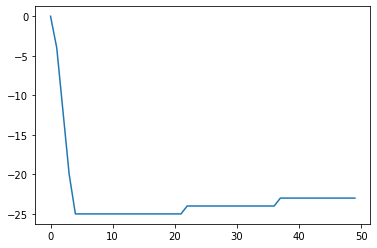

In [994]:
plt.plot(-np.cumsum(mvt,axis=-1)[0,:])

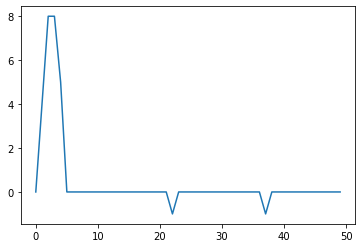

In [995]:
plt.plot(mvt[0,:])

In [996]:
np.argmax(mvt[0,:])

2

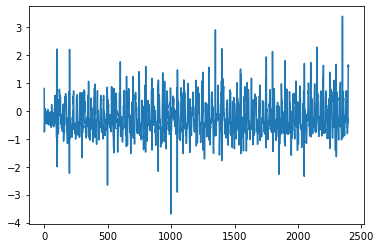

In [997]:
plt.plot(adj)

In [998]:
image_nav_for_correl.shape

(2400, 400)

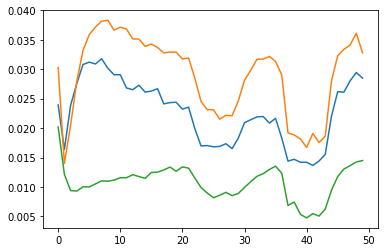

In [999]:
plt.plot(image_nav_for_correl.reshape(nb_slices,nb_gating_spokes,-1)[0,:,100])
plt.plot(image_nav_for_correl.reshape(nb_slices,nb_gating_spokes,-1)[0,:,50])
plt.plot(image_nav_for_correl.reshape(nb_slices,nb_gating_spokes,-1)[0,:,25])



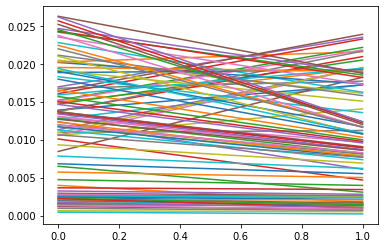

In [1000]:
plt.plot(image_nav_for_correl.reshape(nb_slices,nb_gating_spokes,-1)[0,1:3,::4])


(array([ 20.,  27.,  20.,  18., 132.,  72.,  67.,  13.,  13.,  18.]),
 array([-0.00977543, -0.00738225, -0.00498906, -0.00259588, -0.0002027 ,
         0.00219049,  0.00458367,  0.00697686,  0.00937004,  0.01176323,
         0.01415641], dtype=float32),
 <BarContainer object of 10 artists>)

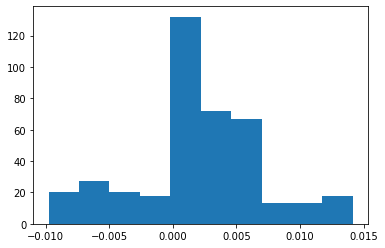

In [1001]:
plt.hist(image_nav_for_correl.reshape(nb_slices,nb_gating_spokes,-1)[0,1,:]-image_nav_for_correl.reshape(nb_slices,nb_gating_spokes,-1)[0,2,:])

In [1002]:
mvt[0,2]

8

In [1003]:
(j+1)%nb_gating_spokes==0

False

In [1004]:
displacement[0] - displacement[j + 1]

12

Text(0.5, 1.0, 'correl maximization plot')

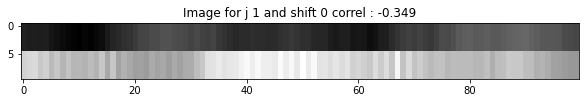

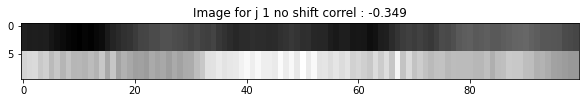

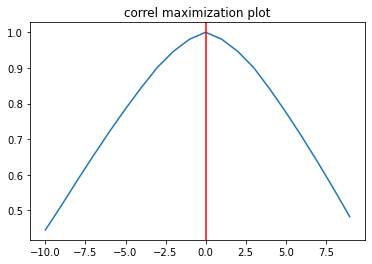

In [1014]:
j=(4*nb_gating_spokes+2-1)
j=(20*nb_gating_spokes-1)
j=0*nb_gating_spokes+2-1

if (j+1)%nb_gating_spokes==0:
    shift = displacement[0]-displacement[j+1]
    shift_for_plot=shift
    plt.figure(figsize=(10,40))
    plt.imshow(np.concatenate([image_nav_for_correl[0,50:150].reshape(-1,1).repeat(5,axis=-1)/np.std(image_nav_for_correl[0,50:150]),image_nav_for_correl[j+1, (50+shift):(150+shift)].reshape(-1,1).repeat(5,axis=-1)/np.std(image_nav_for_correl[j+1,(50+shift):(150+shift)])],axis=-1).T,cmap="gray")
    corr=np.corrcoef(np.concatenate([image_nav_for_correl[0,50:150].reshape(1, -1),
                               image_nav_for_correl[j+1, (50+shift):(150+shift)].reshape(1,
                                                                                               -1)],
                              axis=0))[0, 1]
    #corr=((image_nav_for_correl[j,50:150].reshape(1,-1)/np.max(image_nav_for_correl[j,50:150]))@(image_nav_for_correl[j+1, (50+shift):(150+shift)].reshape(-1,1)/np.max(image_nav_for_correl[j+1,(50+shift):(150+shift)])))[0][0]/image_nav_for_correl[j, 50:150].shape[0]
    plt.title("Image for j {} and shift {} correl : {}".format(j,shift,np.round(corr,3)))
    shift = 0
    plt.figure(figsize=(10,40))
    plt.imshow(np.concatenate([image_nav_for_correl[0,50:150].reshape(-1,1).repeat(5,axis=-1)/np.std(image_nav_for_correl[0,50:150]),image_nav_for_correl[j+1, (50+shift):(150+shift)].reshape(-1,1).repeat(5,axis=-1)/np.std(image_nav_for_correl[j+1,(50+shift):(150+shift)])],axis=-1).T,cmap="gray")
    corr = np.corrcoef(np.concatenate([image_nav_for_correl[0, 50:150].reshape(1, -1),
                                      image_nav_for_correl[j + 1, (50 + shift):(150 + shift)].reshape(1,
                                                                                                     -1)],
                                     axis=0))[0, 1]
    #corr = ((image_nav_for_correl[j, 50:150].reshape(1, -1) / np.max(image_nav_for_correl[j, 50:150])) @ (image_nav_for_correl[j + 1, (50 + shift):(150 + shift)].reshape(-1, 1) / np.max(image_nav_for_correl[j + 1, (50 + shift):(150 + shift)])))[0][0]/image_nav_for_correl[j, 50:150].shape[0]
    plt.title("Image for j {} no shift correl : {}".format(j,np.round(corr,3)))
    
    
else:
    shift = displacement[j] - displacement[j + 1]
    shift_for_plot=shift
    plt.figure(figsize=(10,40))
    plt.imshow(np.concatenate([image_nav_for_correl[j, 50:150].reshape(-1, 1).repeat(5, axis=-1) / np.std(
        image_nav_for_correl[j, 50:150]),
                               image_nav_for_correl[j + 1, (50 + shift):(150 + shift)].reshape(-1, 1).repeat(5,
                                                                                                             axis=-1) / np.std(
                                   image_nav_for_correl[j + 1, (50 + shift):(150 + shift)])], axis=-1).T,cmap="gray")
    #plt.colorbar()
    corr = np.corrcoef(np.concatenate([image_nav_for_correl[j, 50:150].reshape(1, -1),
                                       image_nav_for_correl[j + 1, (50 + shift):(150 + shift)].reshape(1,
                                                                                                       -1)],
                                      axis=0))[0, 1]
    # corr=((image_nav_for_correl[j,50:150].reshape(1,-1)/np.max(image_nav_for_correl[j,50:150]))@(image_nav_for_correl[j+1, (50+shift):(150+shift)].reshape(-1,1)/np.max(image_nav_for_correl[j+1,(50+shift):(150+shift)])))[0][0]/image_nav_for_correl[j, 50:150].shape[0]
    plt.title("Image for j {} and shift {} correl : {}".format(j, shift, np.round(corr, 3)))
    shift = 0
    plt.figure(figsize=(10,40))
    plt.imshow(np.concatenate([image_nav_for_correl[j, 50:150].reshape(-1, 1).repeat(5, axis=-1) / np.std(
        image_nav_for_correl[j, 50:150]),
                               image_nav_for_correl[j + 1, (50 + shift):(150 + shift)].reshape(-1, 1).repeat(5,
                                                                                                             axis=-1) / np.std(
                                   image_nav_for_correl[j + 1, (50 + shift):(150 + shift)])], axis=-1).T,cmap="gray")
    #plt.colorbar()
    corr = np.corrcoef(np.concatenate([image_nav_for_correl[j, 50:150].reshape(1, -1),
                                       image_nav_for_correl[j + 1, (50 + shift):(150 + shift)].reshape(1,
                                                                                                       -1)],
                                      axis=0))[0, 1]
    # corr = ((image_nav_for_correl[j, 50:150].reshape(1, -1) / np.max(image_nav_for_correl[j, 50:150])) @ (image_nav_for_correl[j + 1, (50 + shift):(150 + shift)].reshape(-1, 1) / np.max(image_nav_for_correl[j + 1, (50 + shift):(150 + shift)])))[0][0]/image_nav_for_correl[j, 50:150].shape[0]
    plt.title("Image for j {} no shift correl : {}".format(j, np.round(corr, 3)))
    

plt.figure()
plt.plot(shifts,correls_array[j])
plt.axvline(x=shift_for_plot,c="r")
plt.title("correl maximization plot")

Text(0.5, 1.0, 'correl maximization plot')

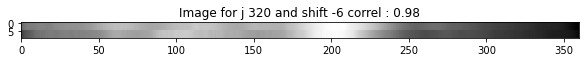

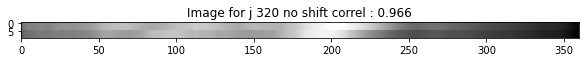

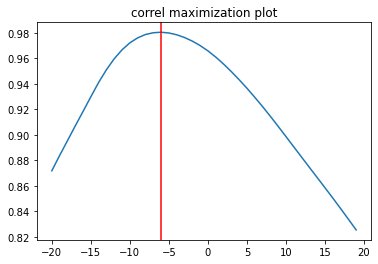

In [1338]:
j=(4*nb_gating_spokes+2-1)
j=(20*nb_gating_spokes-1)
j=6*nb_gating_spokes+20


shift = displacement[j]
shift_for_plot=shift
plt.figure(figsize=(10,40))
plt.imshow(np.concatenate([ft[j%nb_gating_spokes,bottom:top].reshape(-1,1).repeat(5,axis=-1)/np.std(ft[j%nb_gating_spokes,bottom:top]),image_nav_for_correl[j, (bottom+shift):(top+shift)].reshape(-1,1).repeat(5,axis=-1)/np.std(image_nav_for_correl[j,(bottom+shift):(top+shift)])],axis=-1).T,cmap="gray")
corr=np.corrcoef(np.concatenate([ft[j%nb_gating_spokes,bottom:top].reshape(1, -1),
                           image_nav_for_correl[j, (bottom+shift):(top+shift)].reshape(1,
                                                                                           -1)],
                          axis=0))[0, 1]
#corr=((image_nav_for_correl[j,50:150].reshape(1,-1)/np.max(image_nav_for_correl[j,50:150]))@(image_nav_for_correl[j+1, (50+shift):(150+shift)].reshape(-1,1)/np.max(image_nav_for_correl[j+1,(50+shift):(150+shift)])))[0][0]/image_nav_for_correl[j, 50:150].shape[0]
plt.title("Image for j {} and shift {} correl : {}".format(j,shift,np.round(corr,3)))
shift = 0
plt.figure(figsize=(10,40))
plt.imshow(np.concatenate([ft[j%nb_gating_spokes,bottom:top].reshape(-1,1).repeat(5,axis=-1)/np.std(ft[j%nb_gating_spokes,bottom:top]),image_nav_for_correl[j, (bottom+shift):(top+shift)].reshape(-1,1).repeat(5,axis=-1)/np.std(image_nav_for_correl[j,(bottom+shift):(top+shift)])],axis=-1).T,cmap="gray")
corr = np.corrcoef(np.concatenate([ft[j%nb_gating_spokes, bottom:top].reshape(1, -1),
                                  image_nav_for_correl[j, (bottom + shift):(top + shift)].reshape(1,
                                                                                                 -1)],
                                 axis=0))[0, 1]
#corr = ((image_nav_for_correl[j, 50:150].reshape(1, -1) / np.max(image_nav_for_correl[j, 50:150])) @ (image_nav_for_correl[j + 1, (50 + shift):(150 + shift)].reshape(-1, 1) / np.max(image_nav_for_correl[j + 1, (50 + shift):(150 + shift)])))[0][0]/image_nav_for_correl[j, 50:150].shape[0]
plt.title("Image for j {} no shift correl : {}".format(j,np.round(corr,3)))

    

    

plt.figure()
plt.plot(shifts,correls_array[j])
plt.axvline(x=shift_for_plot,c="r")
plt.title("correl maximization plot")

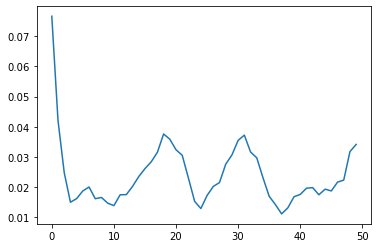

In [1294]:
plt.plot(np.linalg.norm(np.abs((image_nav[7,:,:]-ft).T),axis=0))
print()

In [1284]:
correls_array[j]

array([-0.26168611, -0.14562249, -0.0397656 ,  0.09120592,  0.21145125,
        0.33217901,  0.41994387,  0.47081446,  0.44139608,  0.39839323,
        0.30536577,  0.1943841 ,  0.08033177, -0.01060811, -0.05387687,
       -0.035436  ,  0.01050364,  0.08691109,  0.1457807 ,  0.18052205,
        0.18773008,  0.10188065, -0.00662358, -0.15601283, -0.31083093,
       -0.46655403, -0.61038369, -0.68293117, -0.64793343, -0.59270819,
       -0.50391124, -0.39623993, -0.24595883, -0.06241684,  0.07851904,
        0.22833882,  0.36915854,  0.50929301,  0.5460413 ,  0.54278574])

In [1011]:
displacement.shape

(48, 50)

In [1061]:
correls_array.shape

(2400, 40)

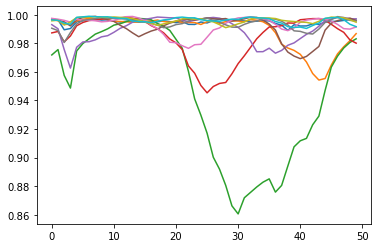

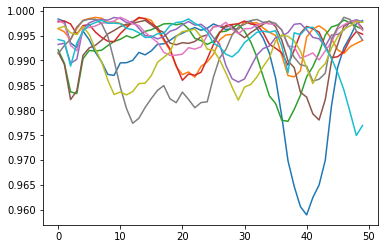

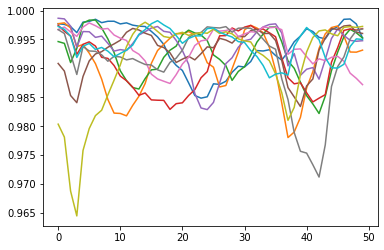

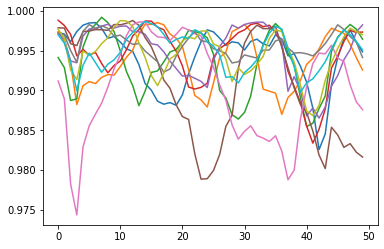

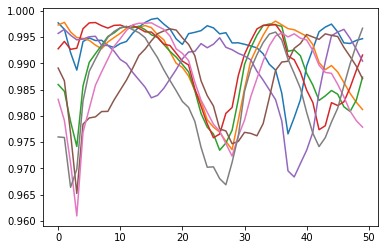

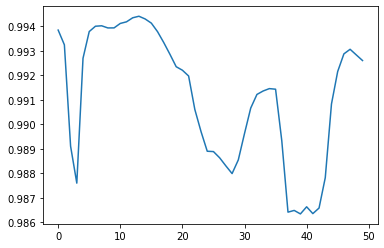

In [1306]:
correls_array_for_plot=np.max(correls_array,axis=-1).reshape(nb_slices,nb_gating_spokes)
correls_array_for_plot[:,:]=correls_array_for_plot[:,:]
plt.plot(correls_array_for_plot[:10,:].T)
plt.figure()
plt.plot(correls_array_for_plot[10:20,:].T)
plt.figure()
plt.plot(correls_array_for_plot[20:30,:].T)
plt.figure()
plt.plot(correls_array_for_plot[30:40,:].T)
plt.figure()
plt.plot(correls_array_for_plot[40:48,:].T)
plt.figure()
plt.plot(np.mean(correls_array_for_plot,axis=0))

In [1208]:
image_nav_for_correl.shape

(2400, 400)

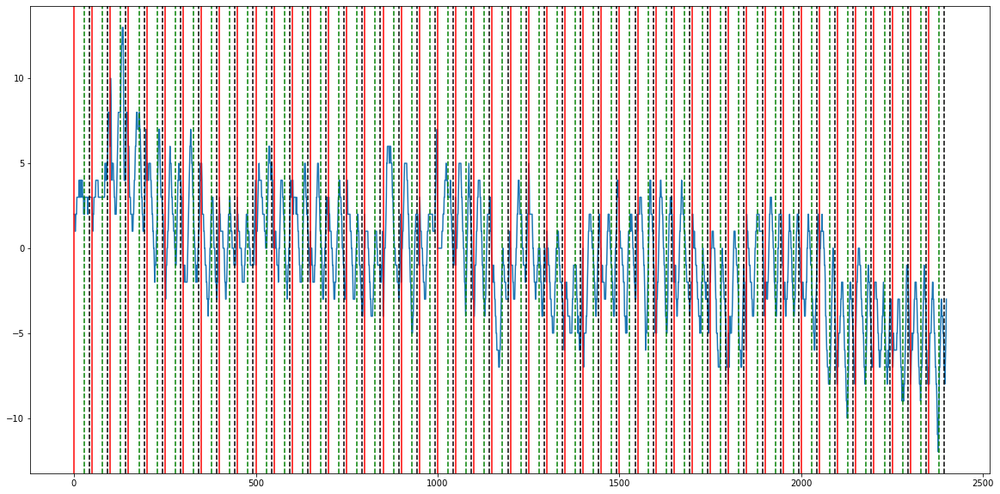

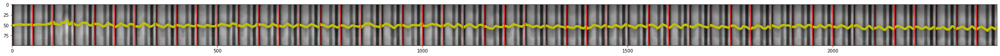

In [1309]:

start_cycle = 0
end_cycle=48
seq_var_ind_1 = 50 / 1400 * 800
seq_var_ind_2 = 50 / 1400 * 1200
plt.figure(figsize=(20, 10))
disp_0=displacement[0]
pixel_start=100

bottom_plot=50
top_plot=150

plt.plot(-displacement[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes)])
for j in range(end_cycle-start_cycle):
    plt.axvline(x=j * nb_gating_spokes, color="r")
    plt.axvline(x=j * nb_gating_spokes + seq_var_ind_1, color="g", linestyle="dashed")
    plt.axvline(x=j * nb_gating_spokes + seq_var_ind_2, color="k", linestyle="dashed")
plt.figure(figsize=(40, 30))
plt.imshow(image_nav_for_correl[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes), bottom_plot:top_plot].T, cmap="gray")
plt.plot(displacement[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes)]-disp_0+pixel_start-bottom_plot,linewidth=5,c="y")
for j in range(end_cycle-start_cycle):
    plt.axvline(x=j * nb_gating_spokes, color="r")

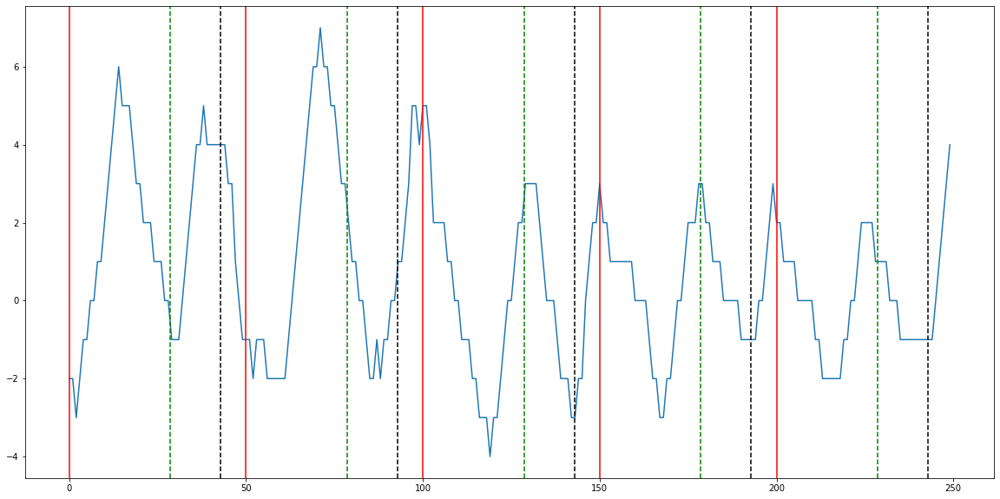

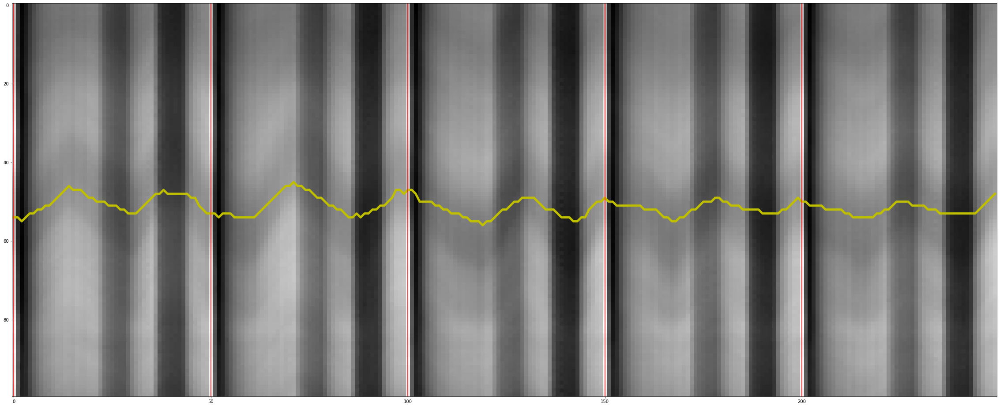

In [1308]:

start_cycle = 5
end_cycle=10
seq_var_ind_1 = 50 / 1400 * 800
seq_var_ind_2 = 50 / 1400 * 1200
plt.figure(figsize=(20, 10))
disp_0=displacement[0]
pixel_start=100

bottom_plot=50
top_plot=150

plt.plot(-displacement[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes)])
for j in range(end_cycle-start_cycle):
    plt.axvline(x=j * nb_gating_spokes, color="r")
    plt.axvline(x=j * nb_gating_spokes + seq_var_ind_1, color="g", linestyle="dashed")
    plt.axvline(x=j * nb_gating_spokes + seq_var_ind_2, color="k", linestyle="dashed")
plt.figure(figsize=(40, 30))
plt.imshow(image_nav_for_correl[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes), bottom_plot:top_plot].T, cmap="gray")
plt.plot(displacement[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes)]-disp_0+pixel_start-bottom_plot,linewidth=5,c="y")
for j in range(end_cycle-start_cycle):
    plt.axvline(x=j * nb_gating_spokes, color="r")

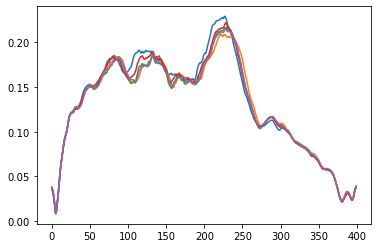

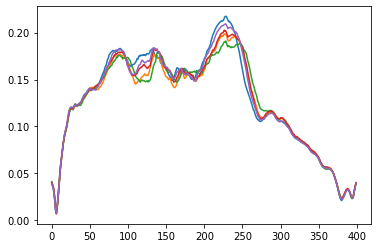

In [1245]:
plt.plot(image_nav[5:10,10,:].T)
plt.figure()
plt.plot(image_nav[43:48,10,:].T)

In [1155]:
displacement.shape

(2400,)

In [1156]:
image_nav_best_channel.shape

(48, 50, 400)

In [1180]:
bottom

50

In [1299]:
image.shape

(48, 50, 400)

In [1313]:

image_for_adj=image.reshape(-1,image.shape[-1])
image_adjusted=np.zeros((image_for_adj.shape[0],top-bottom))
#print(image_nav_best_channel_adjusted.shape)
for j in range(image_adjusted.shape[0]):
    image_adjusted[j,:]=image_for_adj[j,(bottom+displacement[j]):(top+displacement[j])]
    
image_adjusted=image_adjusted.reshape(nb_slices,nb_gating_spokes,-1)


In [1314]:
image_adjusted.shape

(48, 50, 360)

In [1315]:
image_nav_best_channel_adjusted.shape

(48, 50, 100)

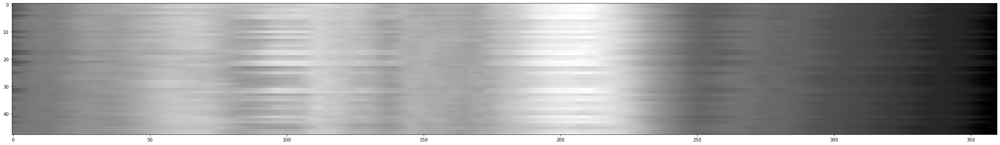

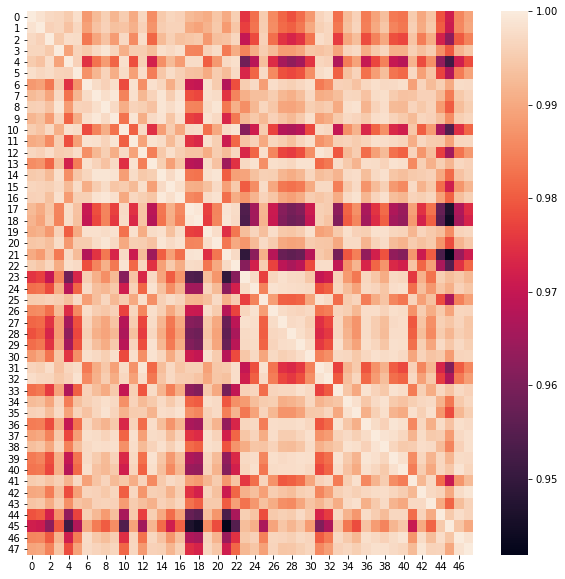

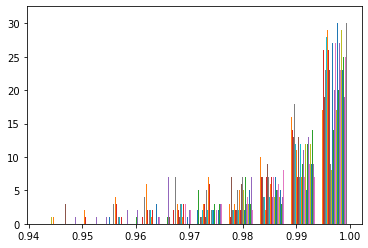

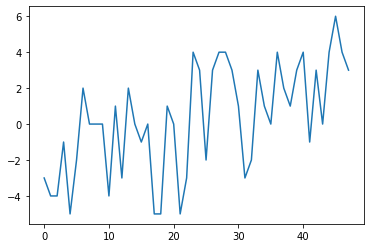

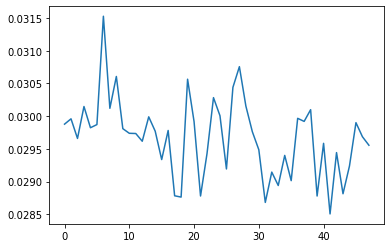

In [1316]:
i=10
plt.figure(figsize=(40,10))
plt.imshow(image_adjusted[:,i,:],cmap="gray")
plt.figure(figsize=(10,10))
sns.heatmap(np.corrcoef(image_adjusted[:,i,:]))
plt.figure()
plt.hist(np.corrcoef(image_adjusted[:,i,:]));
plt.figure()
plt.plot(displacement[i::nb_gating_spokes]);
plt.figure()
plt.plot(image_adjusted[:,i,20])

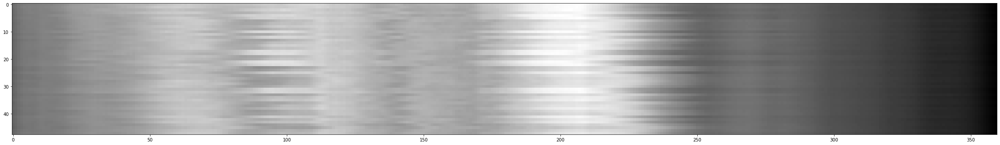

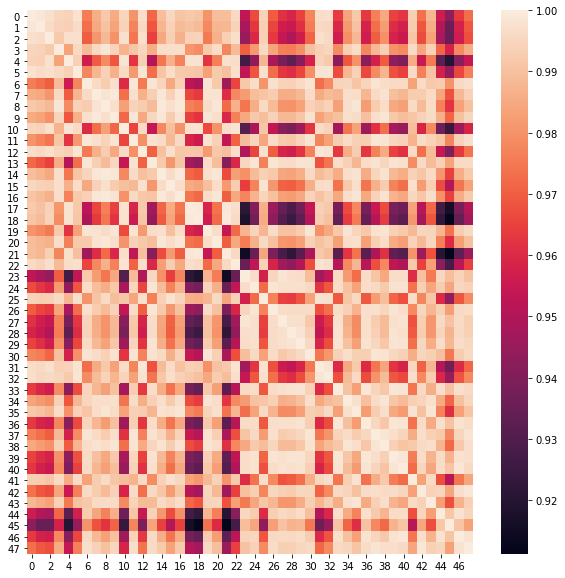

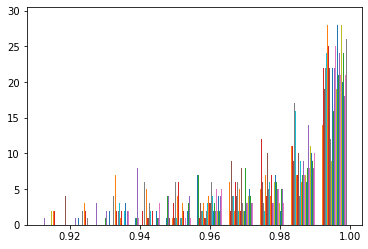

In [1317]:
plt.figure(figsize=(40,10))
plt.imshow(image[:,i,bottom:top],cmap="gray")
plt.figure(figsize=(10,10))
sns.heatmap(np.corrcoef(image[:,i,bottom:top]))
plt.figure()
plt.hist(np.corrcoef(image[:,i,bottom:top]));

In [1164]:
image_nav_best_channel_adjusted.shape[0]

9600

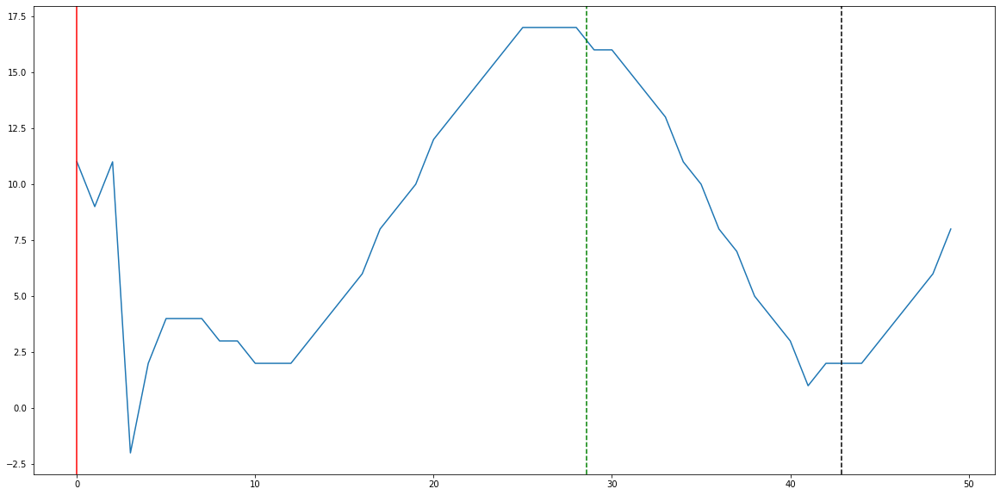

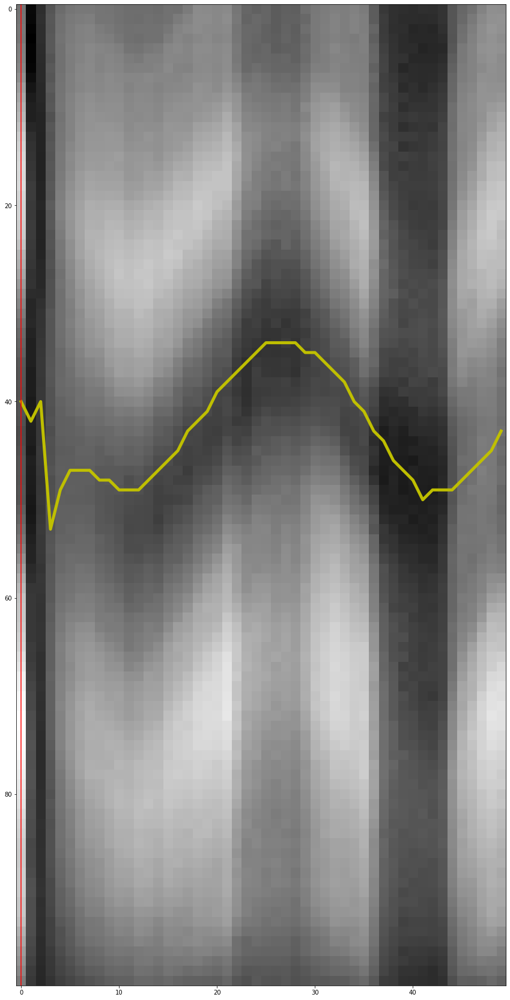

In [1154]:
start_cycle = 3
end_cycle=4
seq_var_ind_1 = 50 / 1400 * 800
seq_var_ind_2 = 50 / 1400 * 1200
plt.figure(figsize=(20, 10))
disp_0=displacement[0]
pixel_start=100

bottom_plot=50
top_plot=150

plt.plot(-displacement[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes)])
for j in range(end_cycle-start_cycle):
    plt.axvline(x=j * nb_gating_spokes, color="r")
    plt.axvline(x=j * nb_gating_spokes + seq_var_ind_1, color="g", linestyle="dashed")
    plt.axvline(x=j * nb_gating_spokes + seq_var_ind_2, color="k", linestyle="dashed")
plt.figure(figsize=(40, 30))
plt.imshow(image_nav_for_correl[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes), bottom_plot:top_plot].T, cmap="gray")
plt.plot(displacement[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes)]-disp_0+pixel_start-bottom_plot,linewidth=5,c="y")
for j in range(end_cycle-start_cycle):
    plt.axvline(x=j * nb_gating_spokes, color="r")

In [1092]:
disp=displacement[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes)]
disp
disp_ft=finufft.nufft1d2(np.arange(-np.pi,np.pi,4*np.pi/nb_gating_spokes).astype(np.float32),displacement[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes)].astype(np.complex64))

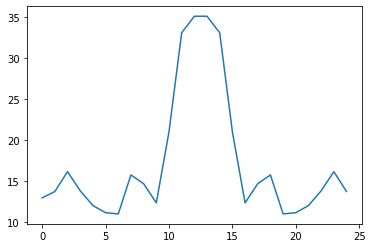

In [1093]:
plt.plot(np.abs(disp_ft))

In [ ]:
len(disp_ft)=

In [811]:
np.max(np.abs(displacement-displacement_correl))

0

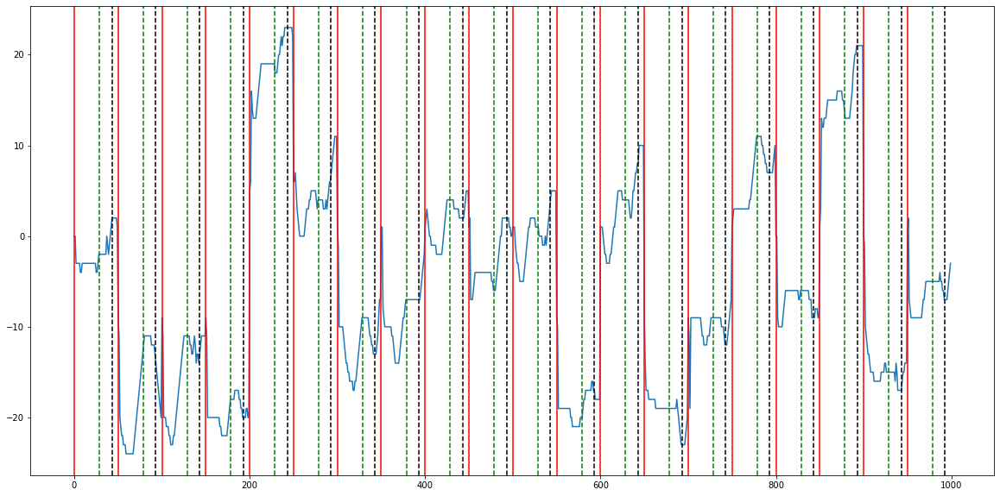

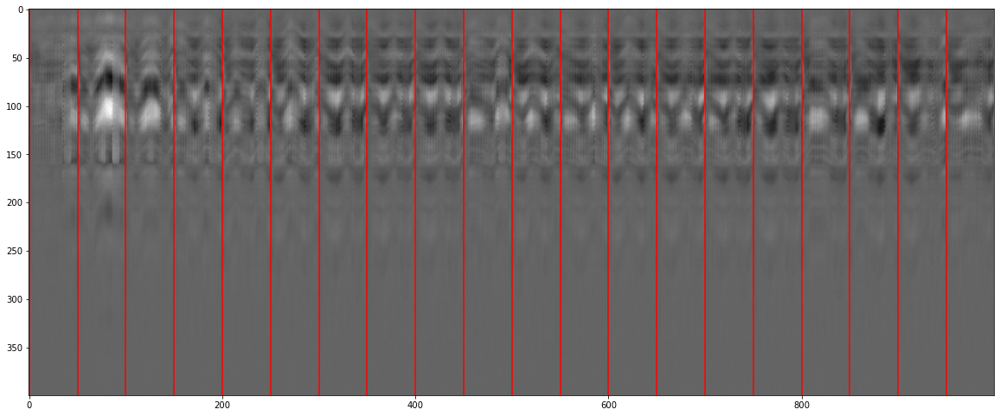

In [819]:

start_cycle = 0
end_cycle=20
seq_var_ind_1 = 50 / 1400 * 800
seq_var_ind_2 = 50 / 1400 * 1200
plt.figure(figsize=(20, 10))
plt.plot(displacement_distance[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes)])
for j in range(end_cycle-start_cycle):
    plt.axvline(x=j * nb_gating_spokes, color="r")
    plt.axvline(x=j * nb_gating_spokes + seq_var_ind_1, color="g", linestyle="dashed")
    plt.axvline(x=j * nb_gating_spokes + seq_var_ind_2, color="k", linestyle="dashed")
plt.figure(figsize=(20, 30))
plt.imshow(image_nav_for_correl[(start_cycle * nb_gating_spokes):(end_cycle * nb_gating_spokes), :].T, cmap="gray")
for j in range(end_cycle-start_cycle):
    plt.axvline(x=j * nb_gating_spokes, color="r")

In [27]:
displacement=calculate_displacement_from_nav_images(image_nav,bottom=50,top=250)

100%|██████████| 2399/2399 [00:03<00:00, 677.42it/s]


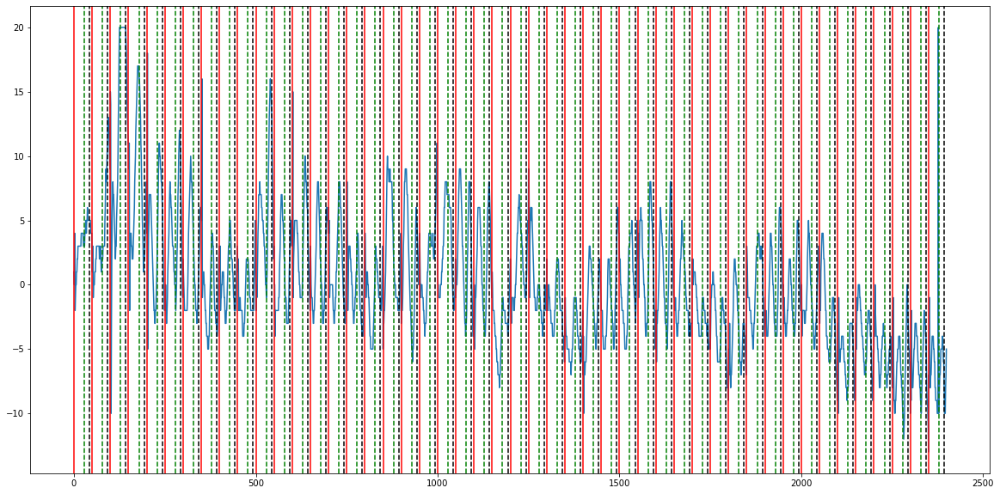

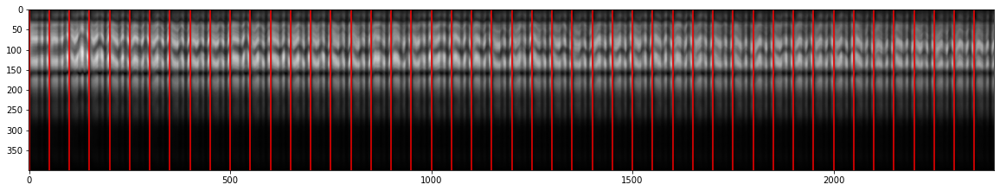

In [1051]:
nb_cycles=48
seq_var_ind_1=50/1400*800
seq_var_ind_2=50/1400*1200

plt.figure(figsize=(20,10))
plt.plot(-displacement[:nb_cycles*nb_gating_spokes])
for j in range(nb_cycles):
    plt.axvline(x=j*nb_gating_spokes,color="r")
    plt.axvline(x=j*nb_gating_spokes+seq_var_ind_1,color="g",linestyle="dashed")
    plt.axvline(x=j*nb_gating_spokes+seq_var_ind_2,color="k",linestyle="dashed")


plt.figure(figsize=(20,30))
plt.imshow(image.reshape(-1,int(npoint/2))[:nb_cycles*nb_gating_spokes,:].T,cmap="gray")
for j in range(nb_cycles):
    plt.axvline(x=j*nb_gating_spokes,color="r")




(array([  3.,   2.,   0.,   2.,   3.,   0.,   1.,   0.,  19.,  19.,   0.,
         31.,  73.,   0., 119.,   0., 186., 246.,   0., 259., 257.,   0.,
        265.,   0., 258., 215.,   0., 137., 109.,   0.,  78.,   0.,  67.,
         34.,   0.,  10.,   5.,   0.,   1.,   1.]),
 array([-13.   , -12.375, -11.75 , -11.125, -10.5  ,  -9.875,  -9.25 ,
         -8.625,  -8.   ,  -7.375,  -6.75 ,  -6.125,  -5.5  ,  -4.875,
         -4.25 ,  -3.625,  -3.   ,  -2.375,  -1.75 ,  -1.125,  -0.5  ,
          0.125,   0.75 ,   1.375,   2.   ,   2.625,   3.25 ,   3.875,
          4.5  ,   5.125,   5.75 ,   6.375,   7.   ,   7.625,   8.25 ,
          8.875,   9.5  ,  10.125,  10.75 ,  11.375,  12.   ]),
 <BarContainer object of 40 artists>)

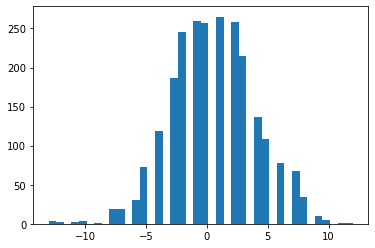

In [1318]:
plt.hist(displacement,bins=40)

In [722]:
displacement.shape

(2400,)

In [1319]:
displacement_for_binning=displacement
#displacement_for_binning[displacement_for_binning>np.percentile(displacement,95)]=np.percentile(displacement,95)
#displacement_for_binning[displacement_for_binning<np.percentile(displacement,5)]=np.percentile(displacement,5)


In [1320]:
x_FOV/400

1.0

In [1329]:
bin_width=5


In [1330]:
max_bin=np.max(displacement_for_binning)

In [1331]:
min_bin=np.min(displacement_for_binning)

In [1332]:
nbins=10
bins=np.arange(min_bin,max_bin+bin_width,bin_width)

In [1333]:
bins

array([-13,  -8,  -3,   2,   7,  12])

In [1334]:
categories=np.digitize(displacement_for_binning,bins)

In [1335]:
df_cat=pd.DataFrame(data=np.array([displacement,categories]).T,columns=["displacement","cat"])

In [1336]:
df_cat.groupby("cat").count()

,displacement
cat,
1,11
2,261
3,1213
4,797
5,117
6,1


In [72]:
df_groups=df_cat.groupby("cat").count()

In [73]:
df_groups

,displacement
cat,
0,594
1,1301
2,505


In [79]:
df_groups.displacement.max()

1301

In [80]:
df_groups.displacement.idxmax()

1

In [86]:
maxi=0
for j in range(bin_width):
    min_bin=np.min(displacement_for_binning)+j
    bins=np.arange(min_bin,max_bin+bin_width,bin_width)
    print(bins)
    categories=np.digitize(displacement_for_binning,bins)
    df_cat=pd.DataFrame(data=np.array([displacement,categories]).T,columns=["displacement","cat"])
    df_groups = df_cat.groupby("cat").count()
    curr_max = df_groups.displacement.max()
    if curr_max>maxi:
        maxi=curr_max
        idx_cat=df_groups.displacement.idxmax()
        retained_nav_spokes = (categories==idx_cat)
        
    print(df_cat.groupby("cat").count())

[-14  -6   2  10]
     displacement
cat              
1             734
2            1312
3             354
[-13  -5   3  11]
     displacement
cat              
0             134
1             727
2            1276
3             263
[-12  -4   4  12]
     displacement
cat              
0             195
1             831
2            1191
3             183
[-11  -3   5]
     displacement
cat              
0             247
1             967
2            1053
3             133
[-10  -2   6]
     displacement
cat              
0             307
1            1105
2             988
[-9 -1  7]
     displacement
cat              
0             393
1            1187
2             820
[-8  0  8]
     displacement
cat              
0             497
1            1212
2             691
[-7  1  9]
     displacement
cat              
0             594
1            1301
2             505


In [87]:
retained_nav_spokes.sum()

/home/cslioussarenko/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


1312

In [90]:
retained_nav_spokes_index=np.argwhere(retained_nav_spokes).flatten()

In [91]:
included_spokes=[s in retained_nav_spokes_index for s in spoke_groups]

NameError: name 'spoke_groups' is not defined

In [89]:
retained_nav_spokes_cond

array([[   0],
       [   3],
       [   4],
       ...,
       [2397],
       [2398],
       [2399]])

In [732]:
df_movement=pd.DataFrame(data=np.concatenate([displacement.reshape(-1,1),np.digitize(displacement_for_binning,bins).reshape(-1,1)],axis=-1),columns=["data","breathing_stage"])

In [748]:
df_movement.groupby("breathing_stage").describe()

data                                                   
                 count       mean       std   min   25%   50%   75%   max
breathing_stage                                                          
1                156.0 -14.884615  0.320514 -15.0 -15.0 -15.0 -15.0 -14.0
2                103.0 -12.553398  0.499571 -13.0 -13.0 -13.0 -12.0 -12.0
3                136.0 -10.463235  0.500490 -11.0 -11.0 -10.0 -10.0 -10.0
4                205.0  -8.521951  0.500741  -9.0  -9.0  -9.0  -8.0  -8.0
5                265.0  -6.528302  0.500143  -7.0  -7.0  -7.0  -6.0  -6.0
6                349.0  -4.461318  0.499217  -5.0  -5.0  -4.0  -4.0  -4.0
7                366.0  -2.540984  0.499000  -3.0  -3.0  -3.0  -2.0  -2.0
8                315.0  -0.409524  0.492528  -1.0  -1.0   0.0   0.0   0.0
9                242.0   1.376033  0.485392   1.0   1.0   1.0   2.0   2.0
10               130.0   3.384615  0.488386   3.0   3.0   3.0   4.0   4.0
11               133.0   5.000000  0.000000   5.0   5.0   5.0   5.0   5.0

In [85]:
displacement.shape

(2400,)

In [758]:
(displacement<=-1).sum()/displacement.shape

array([0.71208333])

In [785]:
inspiration_spokes=np.argwhere(displacement>-1).flatten()

In [784]:
spoke_groups=np.argmin(np.abs(np.arange(0,nb_segments*nb_part,1).reshape(-1,1)-np.arange(0,nb_segments*nb_part,nb_segments/nb_gating_spokes).reshape(1,-1)),axis=-1)

In [786]:
excluded_spokes=[s in inspiration_spokes for s in spoke_groups]

In [792]:
excluded_spokes=np.array(excluded_spokes).reshape(int(nb_part),nb_segments)

array([ True,  True,  True, ...,  True,  True,  True])

In [723]:
pd.DataFrame(displacement).describe()

,0
count,2400.000000
mean,-3.995417
std,6.181530
min,-24.000000
25%,-7.250000
50%,-4.000000
75%,0.000000
max,20.000000


In [92]:
mvt.shape

NameError: name 'mvt' is not defined

<AxesSubplot:>

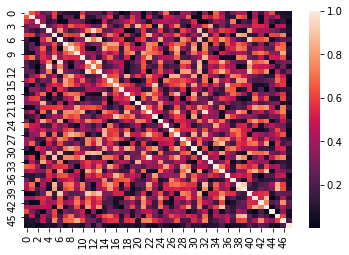

In [1114]:
sns.heatmap(np.abs(np.corrcoef(displacement.reshape(nb_slices,nb_gating_spokes))))

(array([[ 0.,  3.,  4.,  3.,  9., 12., 11.,  4.,  1.,  1.],
        [ 0.,  2., 11.,  3., 11.,  7.,  3.,  6.,  4.,  1.],
        [ 0.,  1.,  6.,  5., 12.,  7., 10.,  5.,  1.,  1.],
        [ 0.,  7.,  9.,  3.,  5.,  5.,  7.,  5.,  3.,  4.],
        [ 4.,  4.,  2.,  5.,  5.,  8., 11.,  6.,  0.,  3.],
        [ 1.,  8.,  5.,  4.,  6.,  6.,  6.,  5.,  2.,  5.],
        [ 5.,  4.,  4.,  8.,  8.,  6.,  1.,  4.,  4.,  4.],
        [ 2.,  9.,  5.,  4.,  8.,  2.,  5.,  4.,  8.,  1.],
        [ 5.,  4.,  5.,  6.,  5.,  6.,  4.,  3.,  6.,  4.],
        [ 4.,  8.,  5.,  2.,  5.,  5.,  8.,  4.,  6.,  1.],
        [ 0.,  7.,  7.,  7.,  5.,  5.,  2.,  8.,  3.,  4.],
        [ 5.,  4.,  3., 10.,  5.,  7.,  4.,  3.,  3.,  4.],
        [ 2.,  5.,  5.,  4.,  6., 11.,  6.,  5.,  1.,  3.],
        [ 4.,  6.,  7.,  4.,  6.,  6.,  4.,  4.,  2.,  5.],
        [ 3.,  2., 10.,  5.,  4.,  5.,  5.,  5.,  4.,  5.],
        [ 4.,  8.,  3.,  5.,  7.,  5.,  5.,  5.,  5.,  1.],
        [ 2., 11.,  3.,  5.,  5.,  3.,  

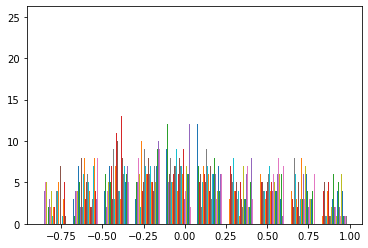

In [1116]:
plt.hist(np.corrcoef(displacement.reshape(nb_slices,nb_gating_spokes)))

<AxesSubplot:>

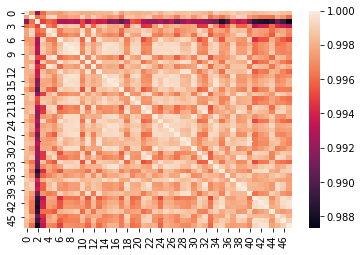

In [713]:
sns.heatmap(np.corrcoef(image_nav.mean(axis=-1)))

<AxesSubplot:>

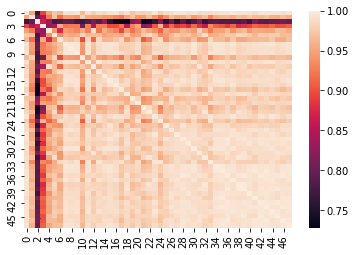

In [714]:
sns.heatmap(np.corrcoef(image_nav[:,:,100]))

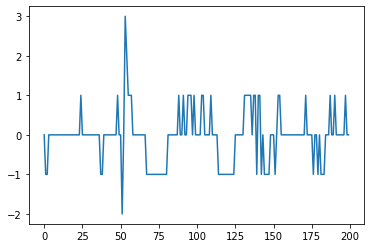

In [660]:
plt.plot(mvt[nb_gating_spokes:5*nb_gating_spokes])

In [594]:
image_nav_centered.shape

(48, 50, 400)

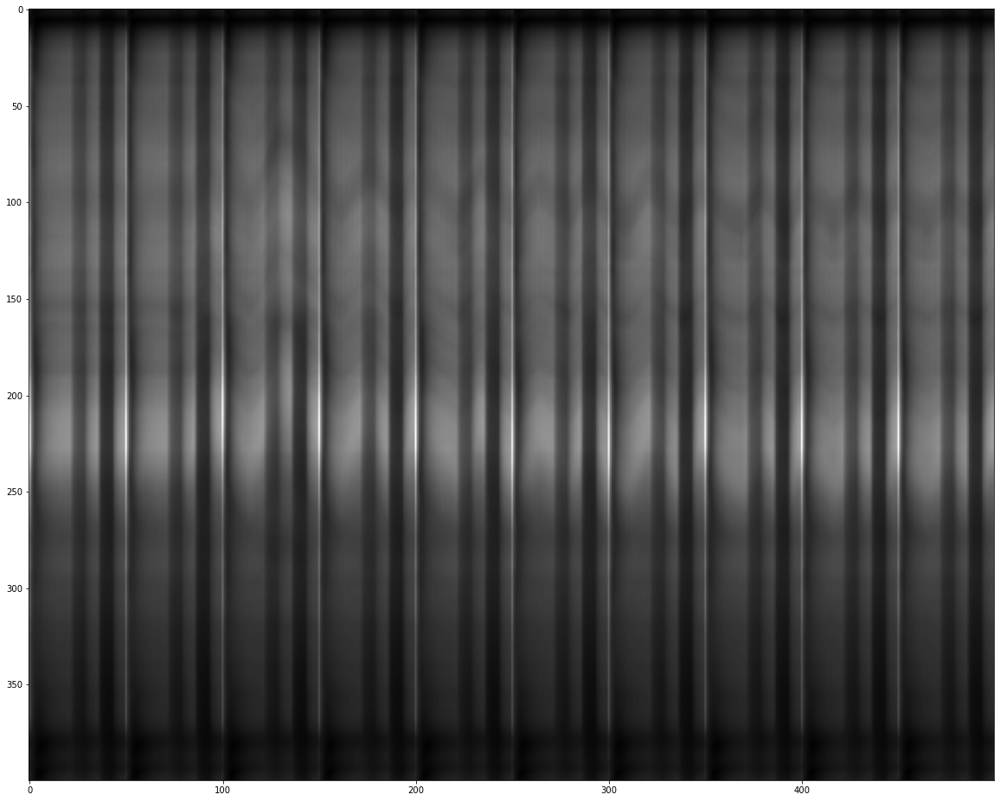

In [417]:
nb_cycles=10
plt.figure(figsize=(20,30))
plt.imshow(image_nav.reshape(-1,int(npoint/2))[:nb_cycles*nb_gating_spokes,:].T,cmap="gray")


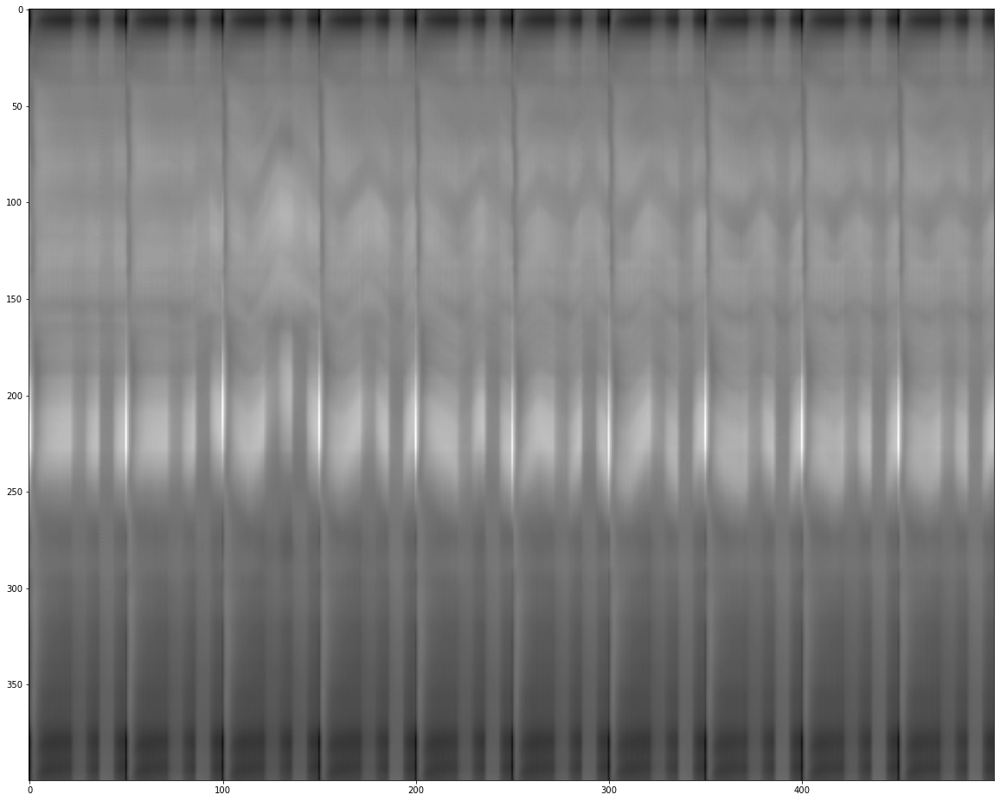

In [418]:
nb_cycles=10
plt.figure(figsize=(20,30))
plt.imshow(image_nav_centered.reshape(-1,int(npoint/2))[:nb_cycles*nb_gating_spokes,:].T,cmap="gray")


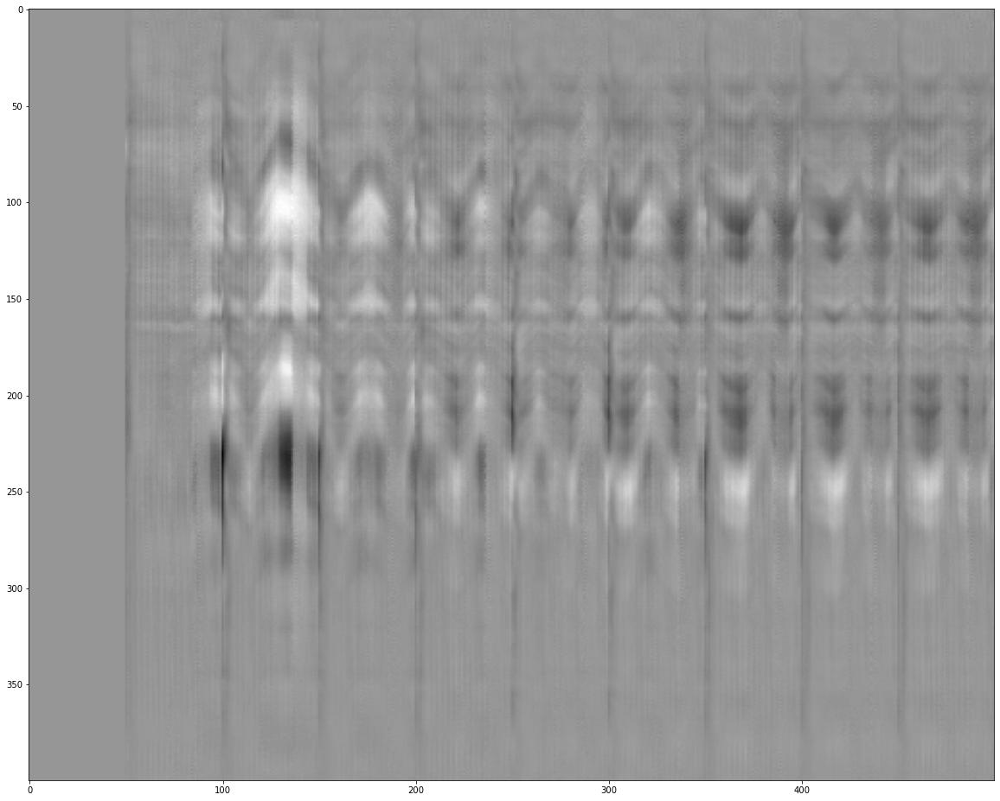

In [419]:
nb_cycles=10
plt.figure(figsize=(20,30))
plt.imshow(image_nav_demod.reshape(-1,int(npoint/2))[:nb_cycles*nb_gating_spokes,:].T,cmap="gray")


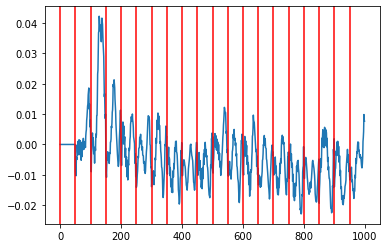

In [420]:
nb_cycles=20
plt.plot(image_nav_demod.reshape(-1,int(npoint/2))[:(nb_cycles*nb_gating_spokes),80:120].mean(axis=-1))
for j in range(nb_cycles):
    plt.axvline(x=j*nb_gating_spokes,color="r")

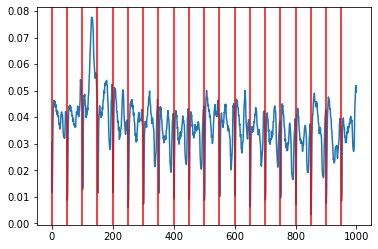

In [421]:
nb_cycles=20
plt.plot(image_nav_centered.reshape(-1,int(npoint/2))[:(nb_cycles*nb_gating_spokes),80:120].mean(axis=-1))
for j in range(nb_cycles):
    plt.axvline(x=j*nb_gating_spokes,color="r")

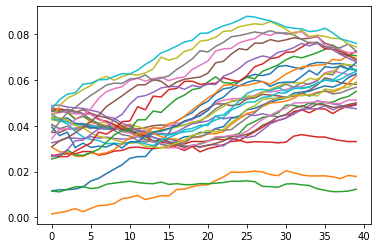

In [440]:
plt.plot(image_nav_centered[2,:30,80:120].T)

In [401]:
image_nav_demod.shape

(48, 50, 400)

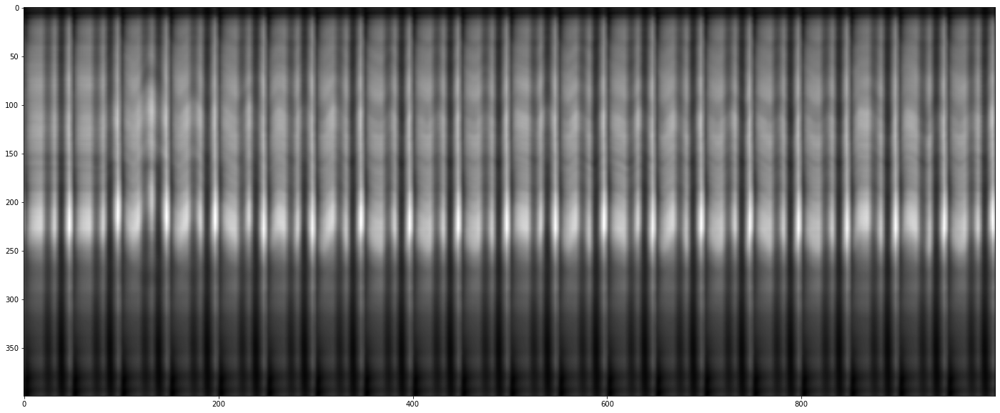

In [391]:
import pandas as pd
plt.figure(figsize=(40,10))

plt.imshow(np.array(pd.DataFrame(image_nav.reshape(-1,int(npoint/2))).rolling(window=5).mean().dropna())[:nb_cycles*nb_gating_spokes,:].T,cmap="gray")

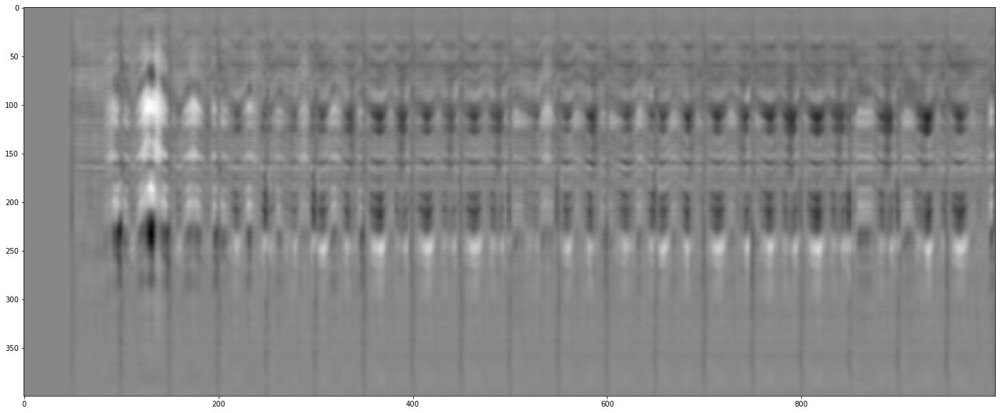

In [392]:
import pandas as pd
plt.figure(figsize=(40,10))
plt.imshow(np.array(pd.DataFrame(image_nav_demod.reshape(-1,int(npoint/2))).rolling(window=5).mean().dropna())[:nb_cycles*nb_gating_spokes,:].T,cmap="gray")

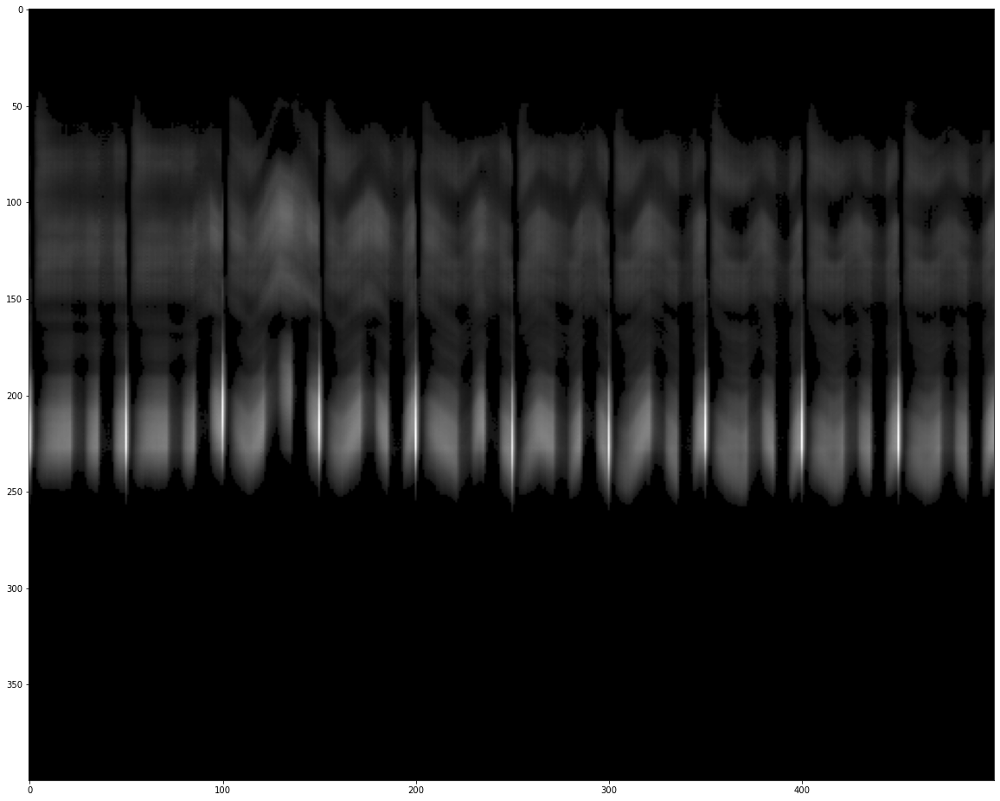

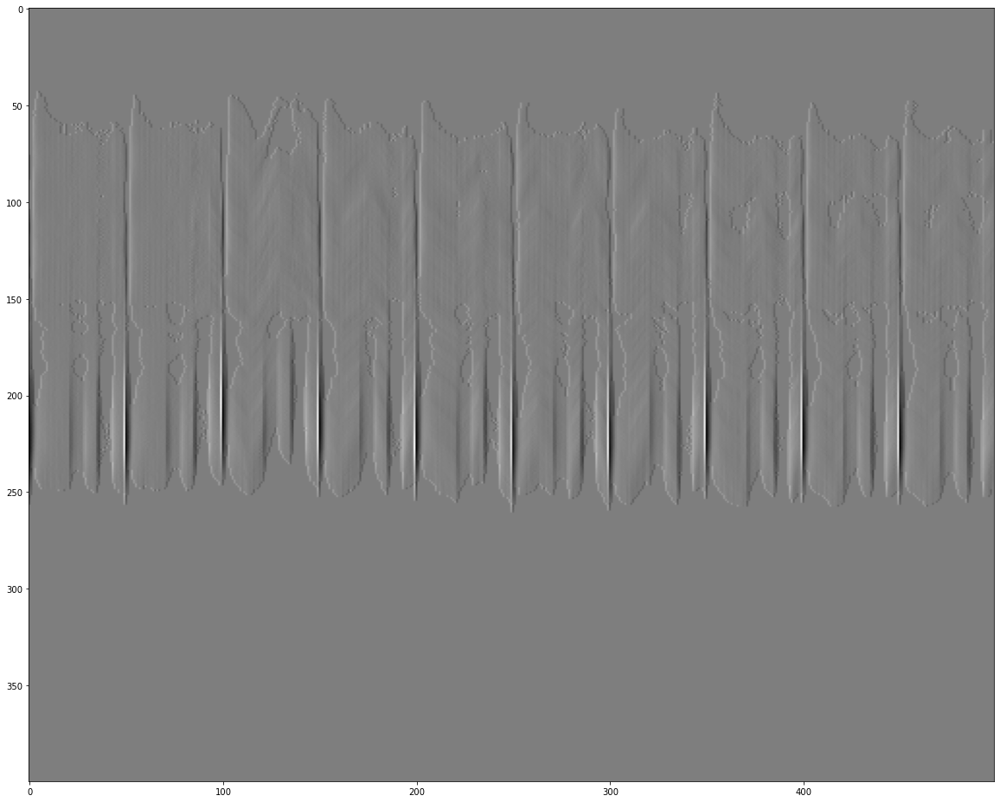

In [345]:
mean = np.mean(image_nav.reshape(-1,int(npoint/2))[:nb_cycles*nb_gating_spokes,:],axis=-1)
image_nav_centered = image_nav.reshape(-1,int(npoint/2))[:nb_cycles*nb_gating_spokes,:].T-mean
image_nav_centered[image_nav_centered<np.percentile(image_nav_centered,60)]=0
plt.figure(figsize=(20,30))
plt.imshow(image_nav_centered,cmap="gray")

image_nav_centered_diff=np.diff(image_nav_centered,axis=-1)
plt.figure(figsize=(20,30))
plt.imshow(image_nav_centered_diff,cmap="gray")


In [353]:
nb_cycles

10

In [354]:
image_nav_demod_centered.shape

(400, 2400)

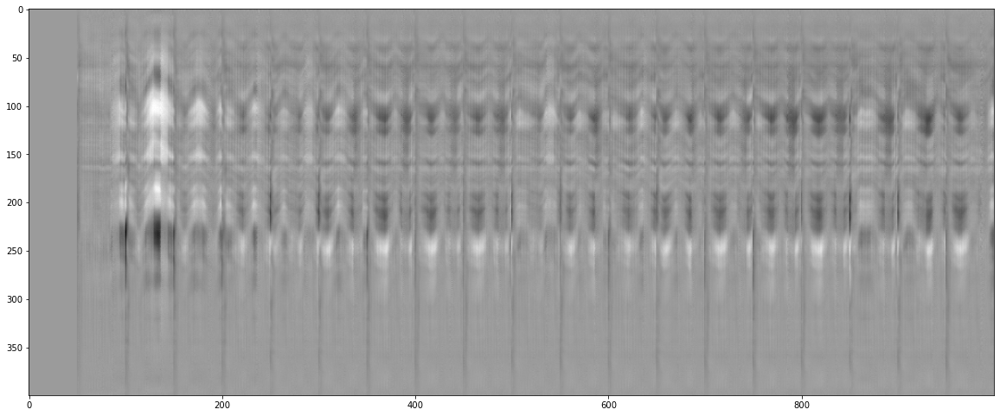

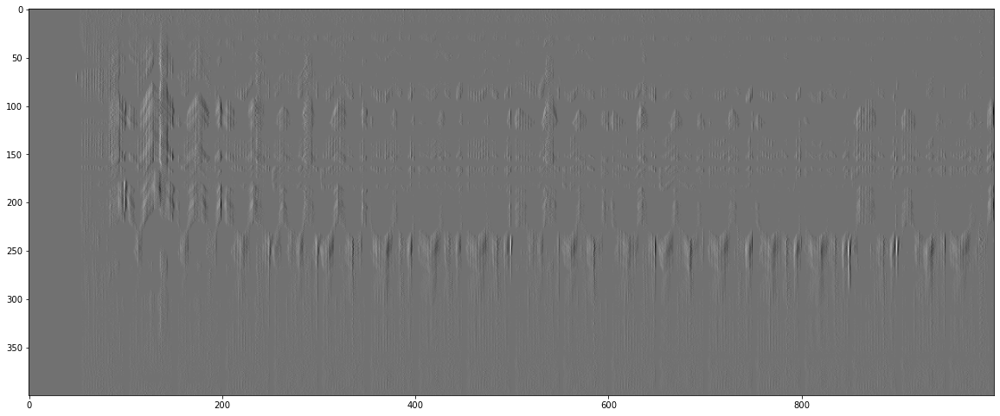

In [380]:
image_nav_demod_centered = image_nav_demod.reshape(-1,int(npoint/2))[:,:].T

plt.figure(figsize=(20,30))
plt.imshow(image_nav_demod_centered[:,:nb_cycles*nb_gating_spokes],cmap="gray")

image_nav_demod_centered_diff=np.diff(image_nav_demod_centered,axis=0)
image_nav_demod_centered_diff[image_nav_demod_centered_diff<np.percentile(image_nav_demod_centered_diff,20)]=0
image_nav_demod_centered_diff[image_nav_demod_centered_diff>np.percentile(image_nav_demod_centered_diff,80)]=0

plt.figure(figsize=(20,30))
plt.imshow(image_nav__demod_centered_diff[:,:nb_cycles*nb_gating_spokes],cmap="gray")


In [308]:
image_diff = np.diff(image_nav,axis=-1)

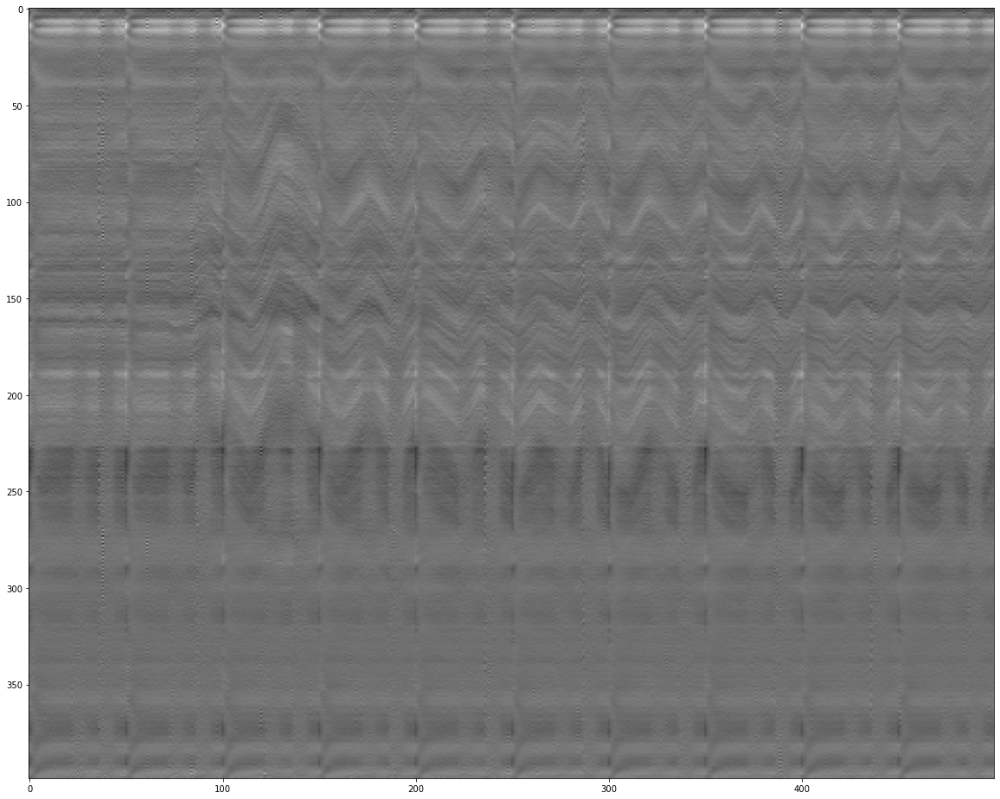

In [309]:
nb_cycles=10
plt.figure(figsize=(20,30))
mean = np.mean(image_diff.reshape(-1,int(npoint/2-1))[:nb_cycles*nb_gating_spokes,:],axis=-1)
plt.imshow(image_diff.reshape(-1,int(npoint/2-1))[:nb_cycles*nb_gating_spokes,:].T-mean,cmap="gray")


Plot in the partition direction : same modulation by MRF so movement should be easier to detect

In [267]:
image_nav.shape

(48, 50, 400)

In [268]:
gating_spoke_no=1

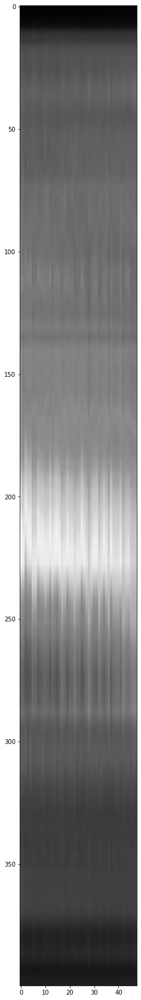

In [271]:

plt.figure(figsize=(20,30))
plt.imshow(image_nav[:,gating_spoke_no,:].T,cmap="gray")


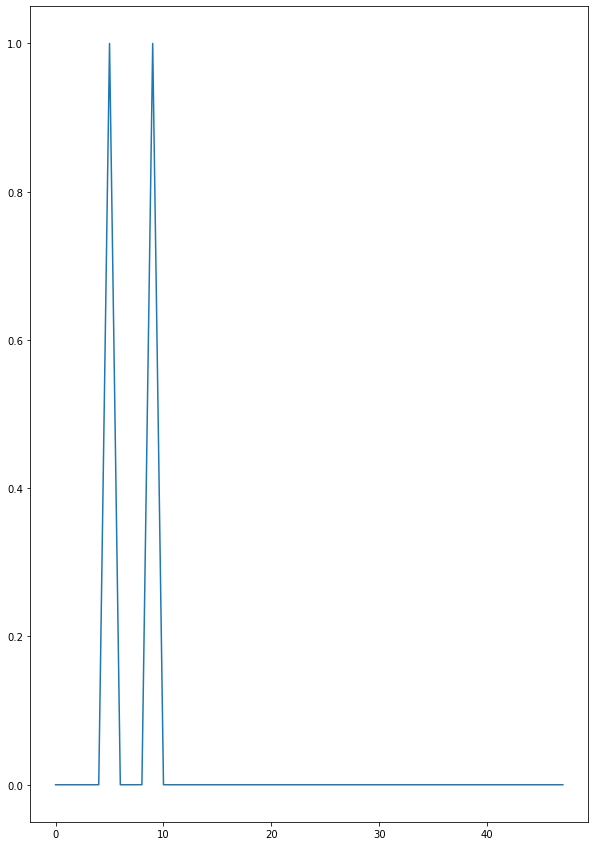

In [270]:

plt.figure(figsize=(10,15))
plt.plot(np.argmin(image_nav[:,gating_spoke_no,:],axis=-1))


In [242]:
def search_right_top(arr,shift=15):
    argmini = np.argmin(arr)
    j = argmini
    
    while np.max(arr[j+1:(j+shift)]>arr[j]):
        j=j+1
                 
    return j
    

In [243]:
search_right_top(image_nav[0,gating_spoke_no,:])

227

In [244]:
right_top_indices=[]
for rep in range(image_nav.shape[0]):
    right_top_indices.append(search_right_top(image_nav[rep,gating_spoke_no,:]))

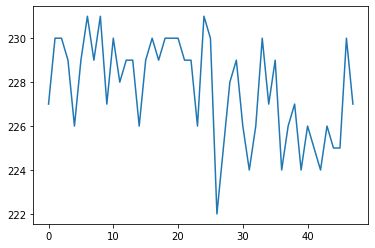

In [245]:
plt.plot(right_top_indices)

In [240]:
np.argmax(right_top_indices)

33

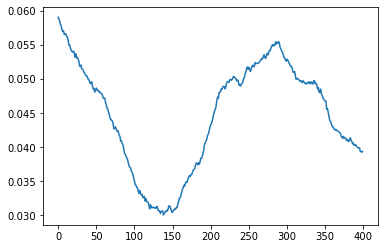

In [241]:
plt.plot(image_nav[33,gating_spoke_no,:])

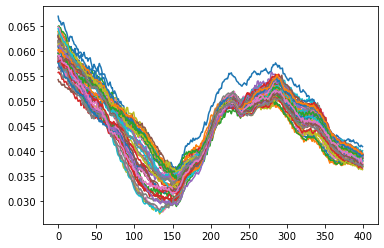

In [217]:
plt.plot(image_nav[:,gating_spoke_no,:].T)


Looking at MRF dictionary regression

In [443]:
FF_list=np.arange(0.,1.05,0.05)
dictfile = "../mrf175_SimReco2.dict"

In [447]:

keys,values=read_mrf_dict(dictfile ,FF_list ,aggregate_components=True)

In [466]:
values.shape

(323190, 175)

In [449]:
values.shape

(323190, 175)

In [477]:
timesteps_nav_for_dico=np.arange(0,175,175/50).astype(int)

In [569]:
pca_dico = PCAComplex(n_components_=15)
pca_dico.fit(values[:,timesteps_nav_for_dico])

PCAComplex(n_components_=15)

In [570]:
pca_dico.components_.shape

(50, 15)

Not using cupy in PCA transform


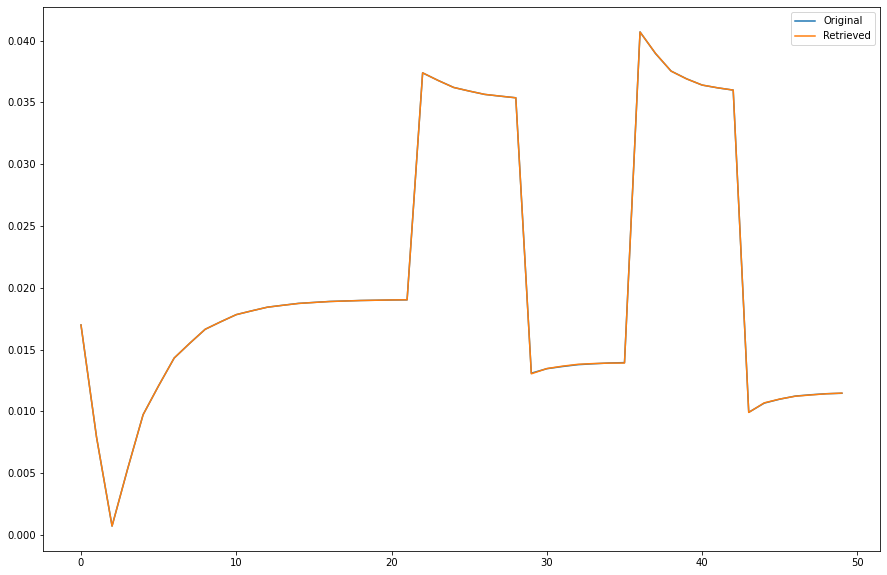

In [571]:
pca_dico.plot_retrieved_signal(values[:,timesteps_nav_for_dico])

In [572]:
images_series_rebuilt_nav.shape

(48, 50, 400)

In [573]:
test_signals=np.moveaxis(images_series_rebuilt_nav,-1,1)

In [574]:
test_signals=test_signals.reshape(-1,nb_gating_spokes)

In [575]:
test_signals.shape

(19200, 50)

In [576]:
test_signals_transf=pca_dico.transform(test_signals)

Not using cupy in PCA transform


Not using cupy in PCA transform


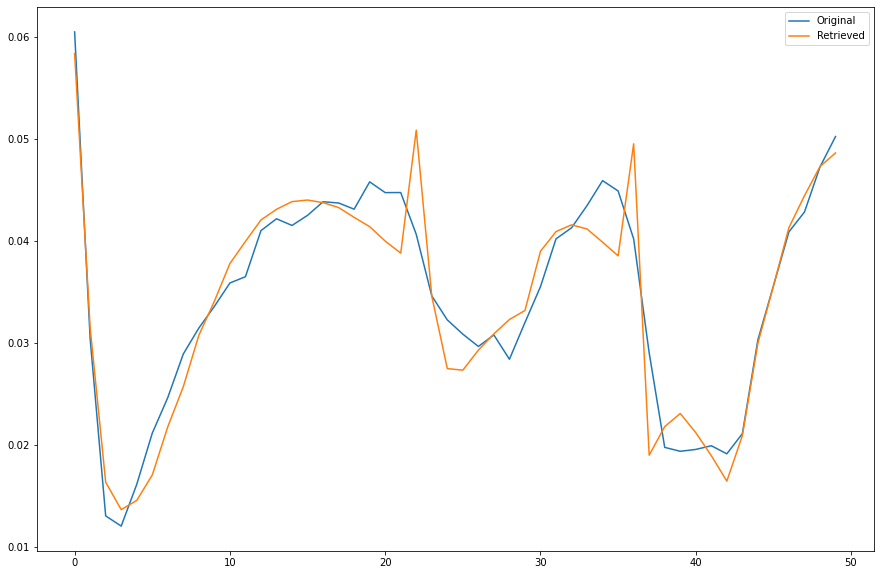

In [577]:
pca_dico.plot_retrieved_signal(test_signals,i=0)

In [593]:
image_nav_centered.shape

(48, 50, 400)

In [578]:
retrieved_signals= np.matmul(test_signals_transf,np.transpose(pca_dico.components_))

In [579]:
retrieved_signals.shape

(19200, 50)

In [580]:
filtered_signals=test_signals-retrieved_signals

In [581]:
images_retrieved = np.abs(retrieved_signals).reshape(int(nb_part),int(npoint/2),-1)
images_retrieved=np.moveaxis(images_retrieved,1,-1)
images_filtered= np.abs(filtered_signals).reshape(int(nb_part),int(npoint/2),-1)
images_filtered=np.moveaxis(images_filtered,1,-1)

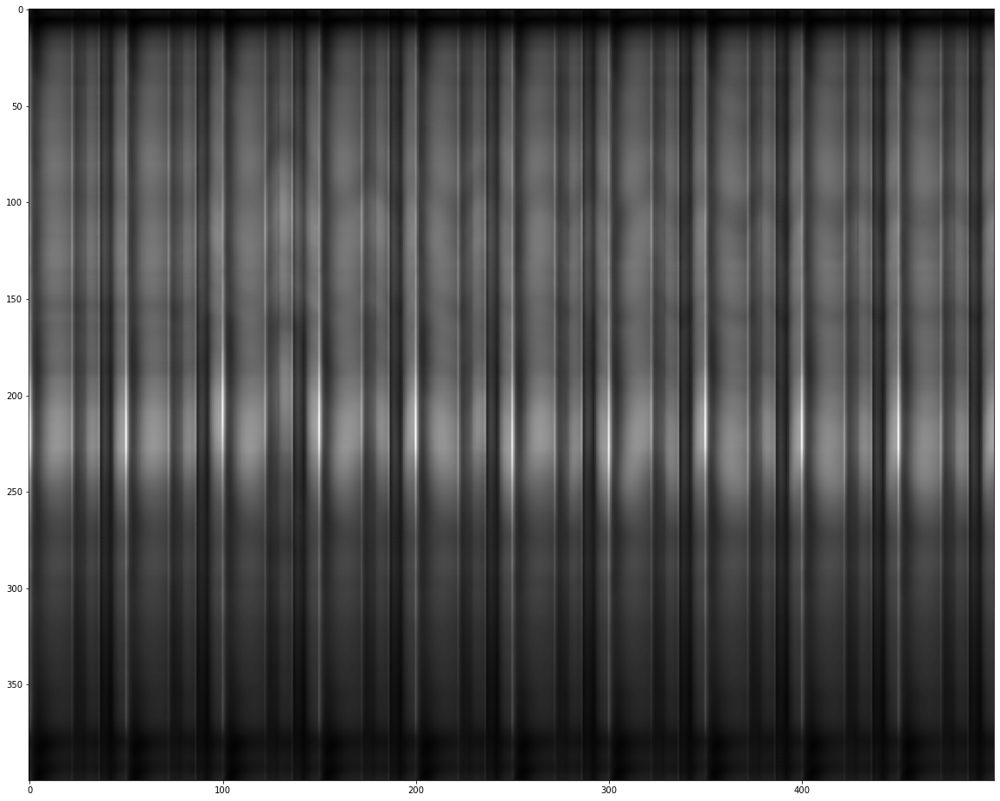

In [582]:
nb_cycles=10
plt.figure(figsize=(20,30))
plt.imshow(images_retrieved.reshape(-1,int(npoint/2))[:nb_cycles*nb_gating_spokes,:].T,cmap="gray")


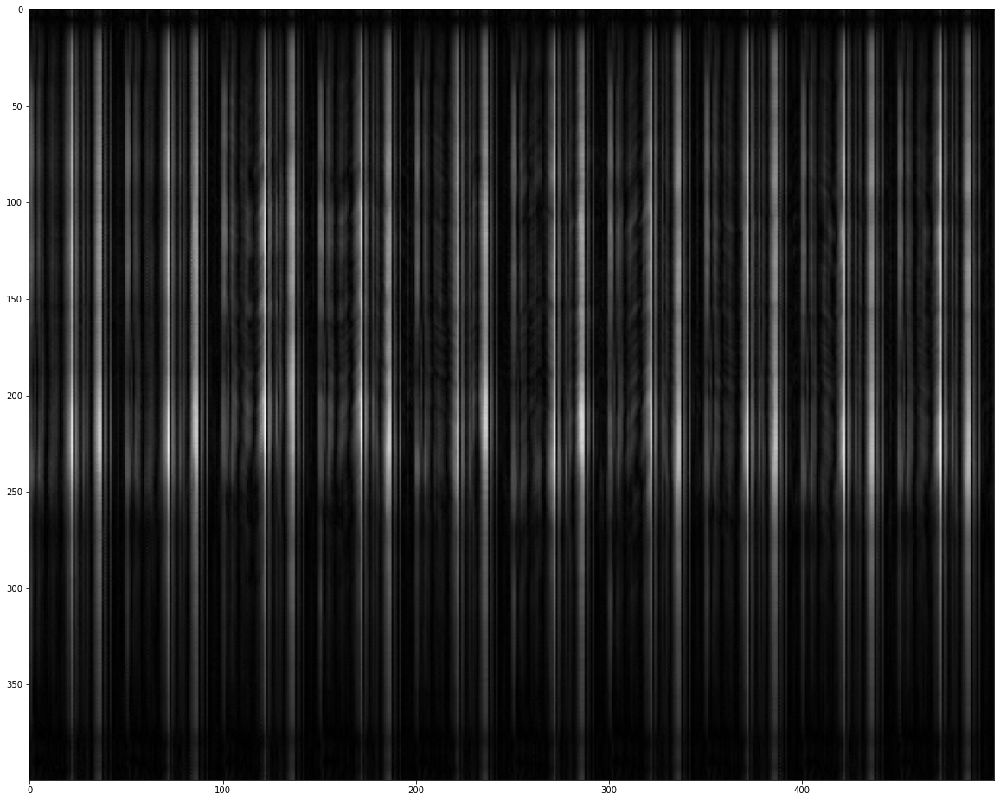

In [583]:
nb_cycles=10
plt.figure(figsize=(20,30))
plt.imshow(images_filtered.reshape(-1,int(npoint/2))[:nb_cycles*nb_gating_spokes,:].T,cmap="gray")


Not using cupy in PCA transform


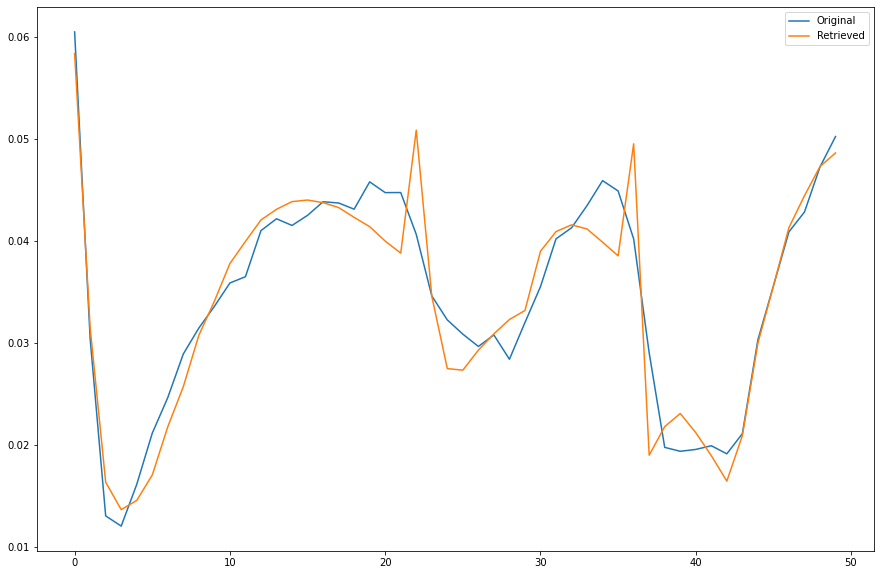

In [487]:
pca_dico.plot_retrieved_signal(test_signals,i=0)

In [584]:
image_nav__demod_centered_diff.shape

(400, 2399)

In [587]:
images_filtered.shape

(48, 50, 400)

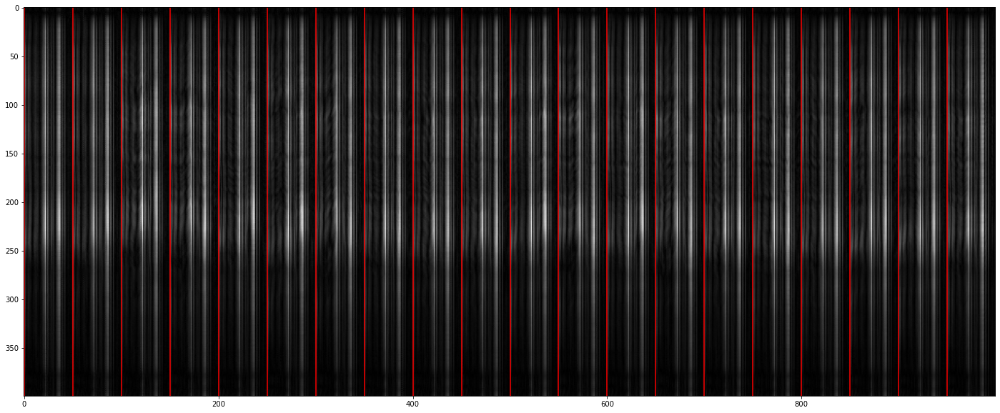

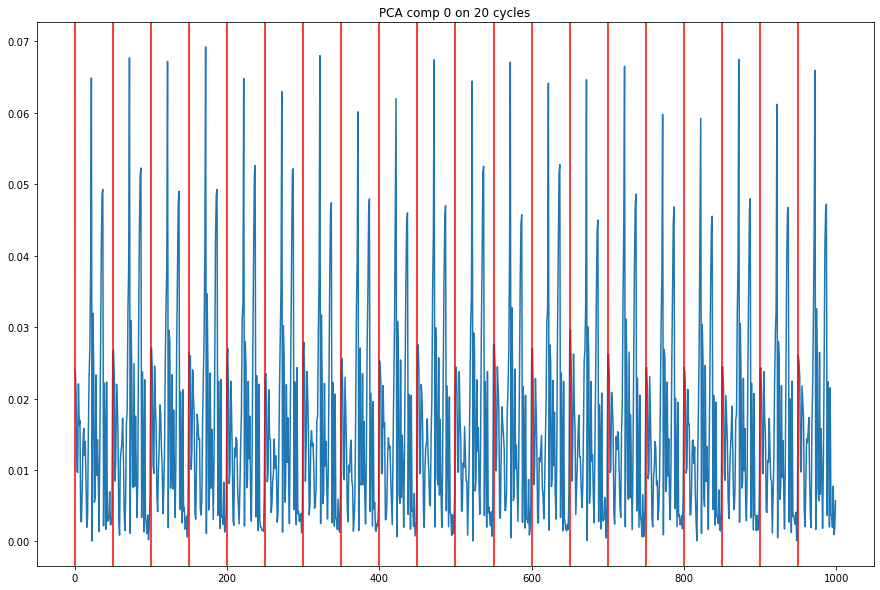

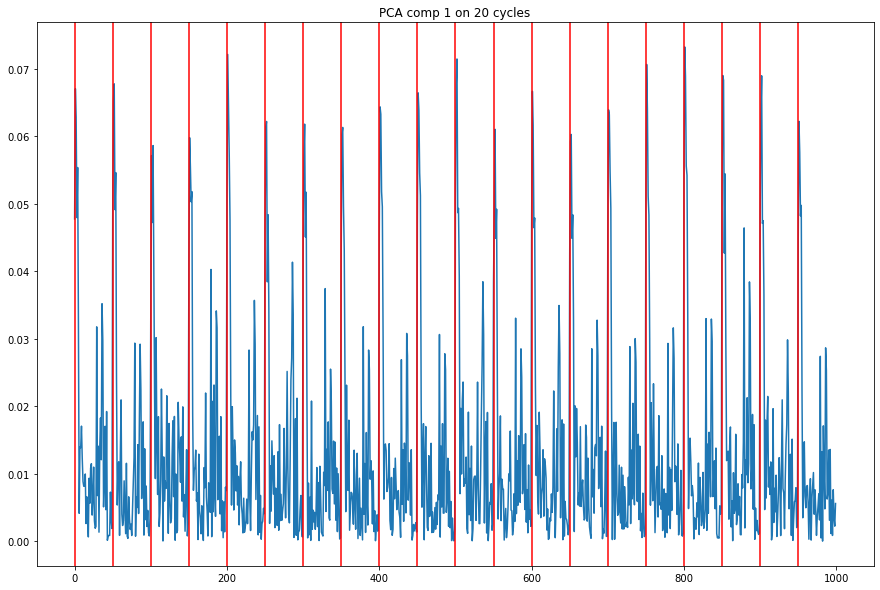

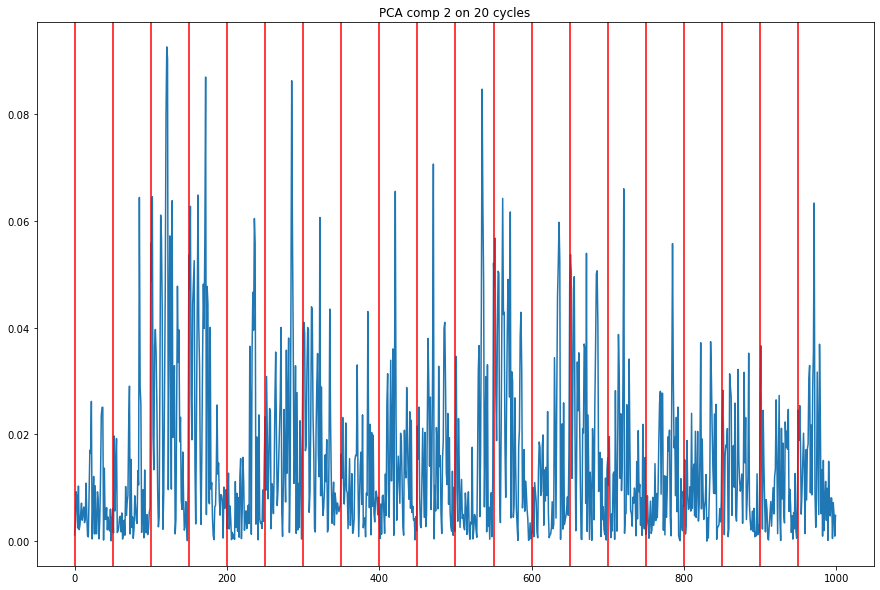

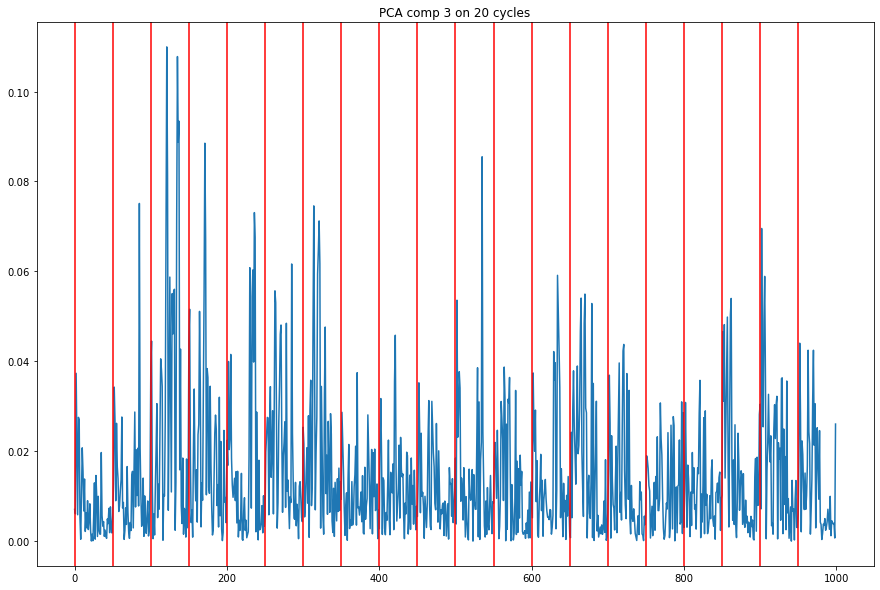

...

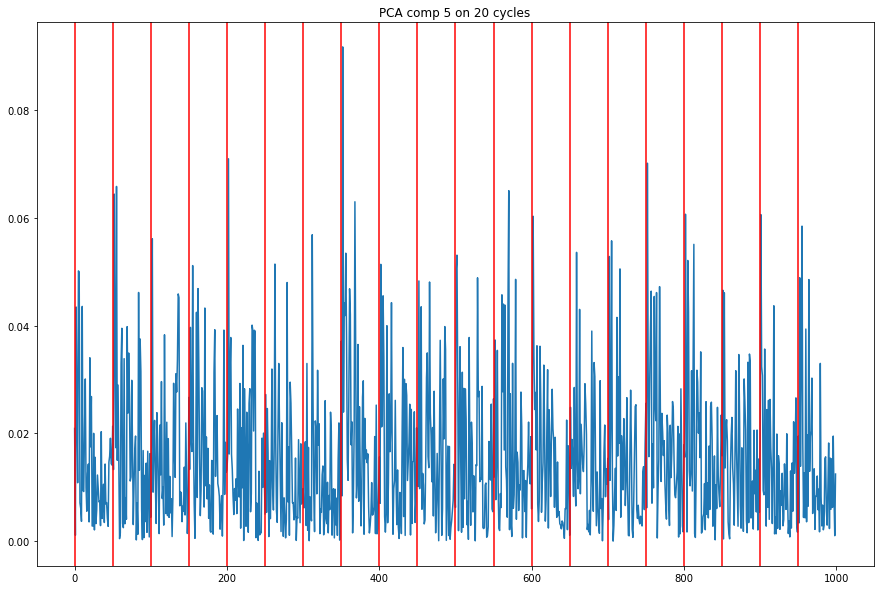

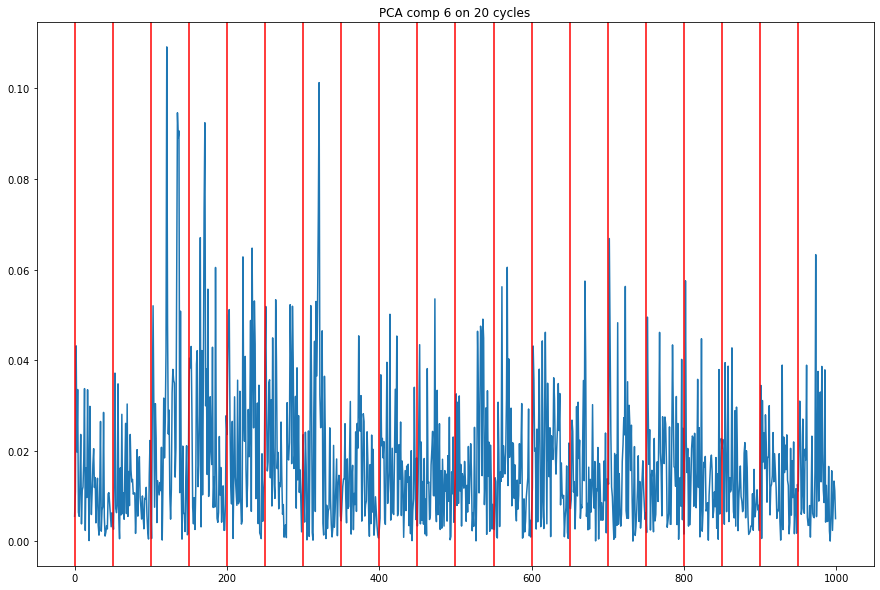

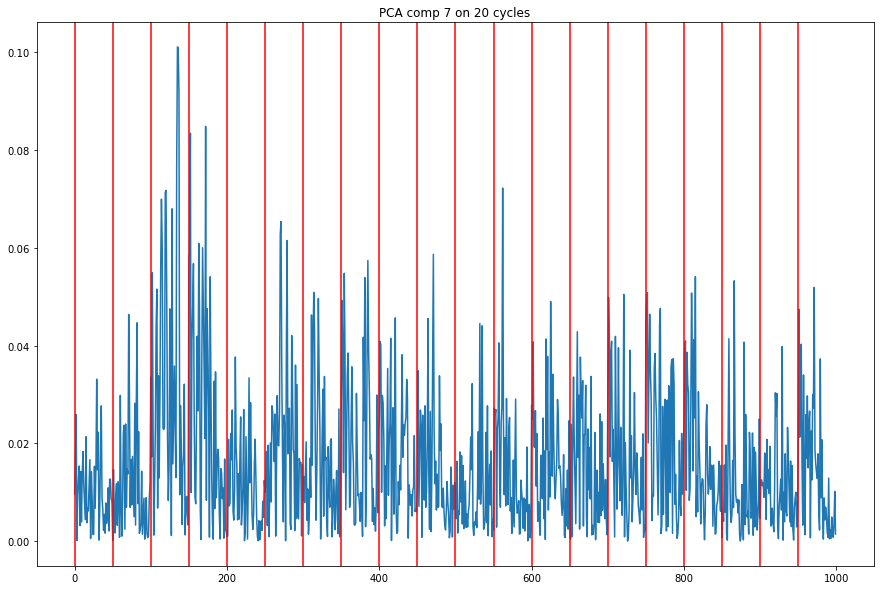

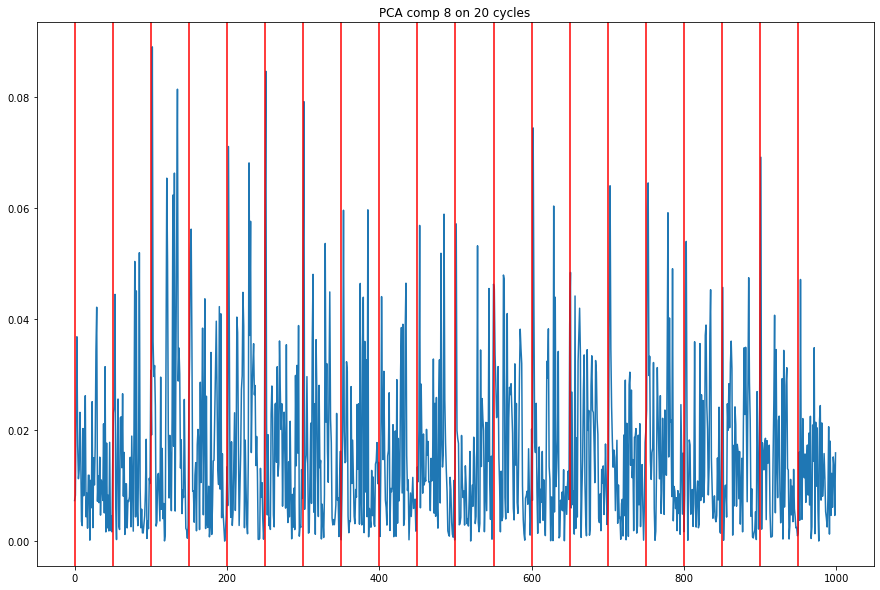

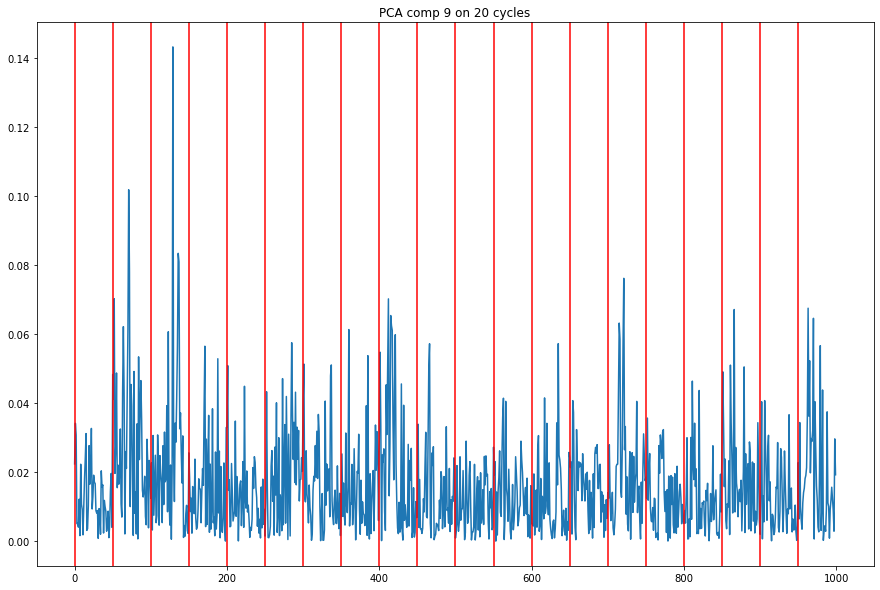

In [588]:
n_comp = 10

nb_cycles=20

from sklearn.decomposition import PCA

image_nav_for_PCA=images_filtered.reshape(-1,int(npoint/2)).T
plt.figure(figsize=(40,10))
plt.imshow(image_nav_for_PCA[:,:nb_cycles*nb_gating_spokes],cmap="gray")
for j in range(nb_cycles):
        plt.axvline(x=j*nb_gating_spokes,color="r")

pca = PCA(n_components=n_comp)
pca.fit(image_nav_for_PCA)


for comp in range(np.minimum(n_comp,10)):
    plt.figure(figsize=(15,10))
    plt.plot(np.abs(pca.components_[comp,:nb_cycles*nb_gating_spokes]))
    plt.title("PCA comp {} on {} cycles".format(comp,nb_cycles))
    for j in range(nb_cycles):
        plt.axvline(x=j*nb_gating_spokes,color="r")

PCA on all gating spokes and partitions

In [317]:
image_diff[:,:,50:250].shape

(48, 50, 200)

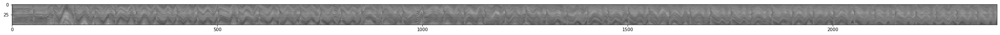

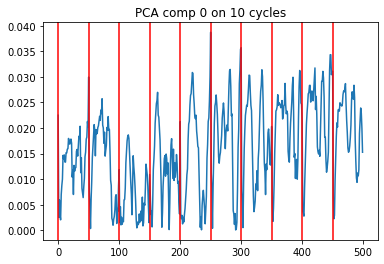

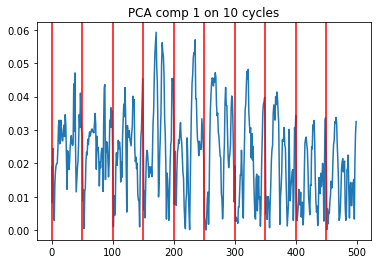

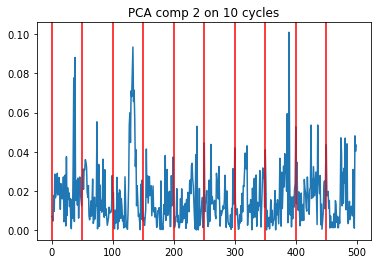

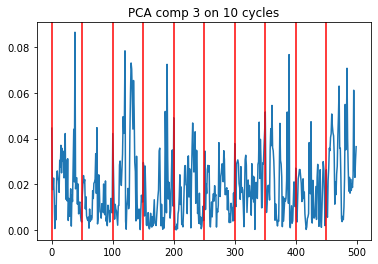

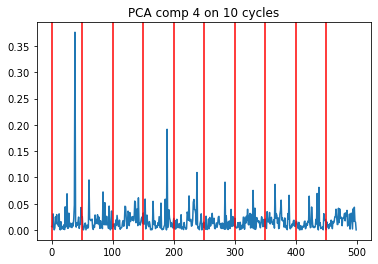

In [331]:

n_comp = 5
i_inf = 50
i_supp = 100
nb_cycles=10

image_nav_for_PCA=image_diff[:,:,i_inf:i_supp].reshape(-1,i_supp-i_inf).T
plt.figure(figsize=(40,10))
plt.imshow(image_nav_for_PCA[:nb_cycles*nb_gating_spokes,:],cmap="gray")


pca = PCAComplex(n_components_=n_comp)
pca.fit(image_nav_for_PCA)


for comp in range(np.minimum(n_comp,10)):
    plt.figure()
    plt.plot(np.abs(pca.components_[:nb_cycles*nb_gating_spokes,comp]))
    plt.title("PCA comp {} on {} cycles".format(comp,nb_cycles))
    for j in range(nb_cycles):
        plt.axvline(x=j*nb_gating_spokes,color="r")


In [337]:
pca.components_.shape

(5, 2400)

In [367]:
image_nav_for_PCA.shape

(400, 2399)

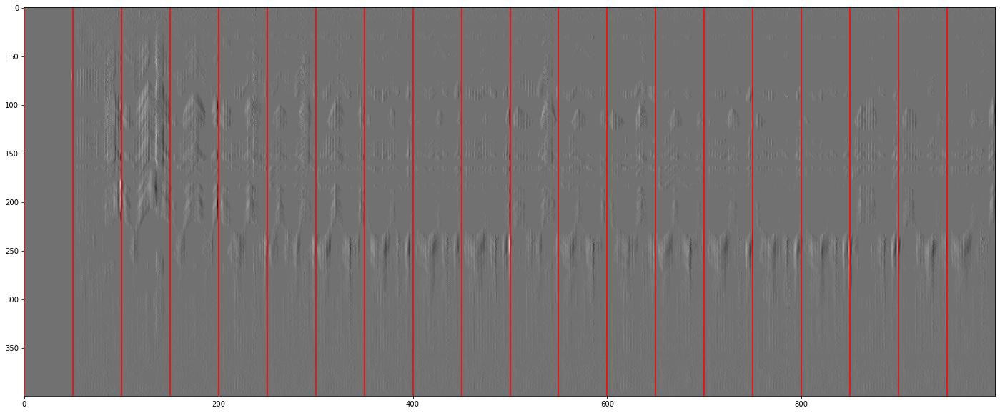

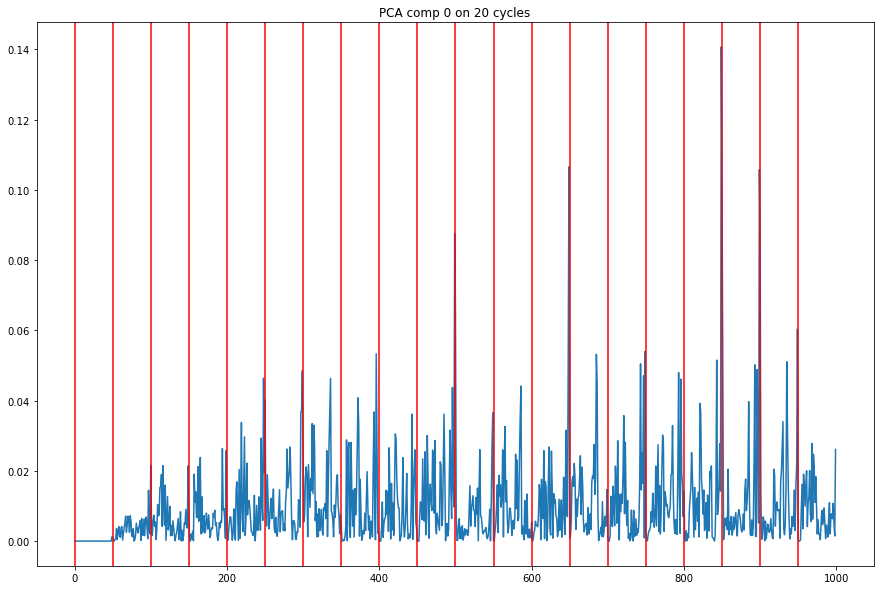

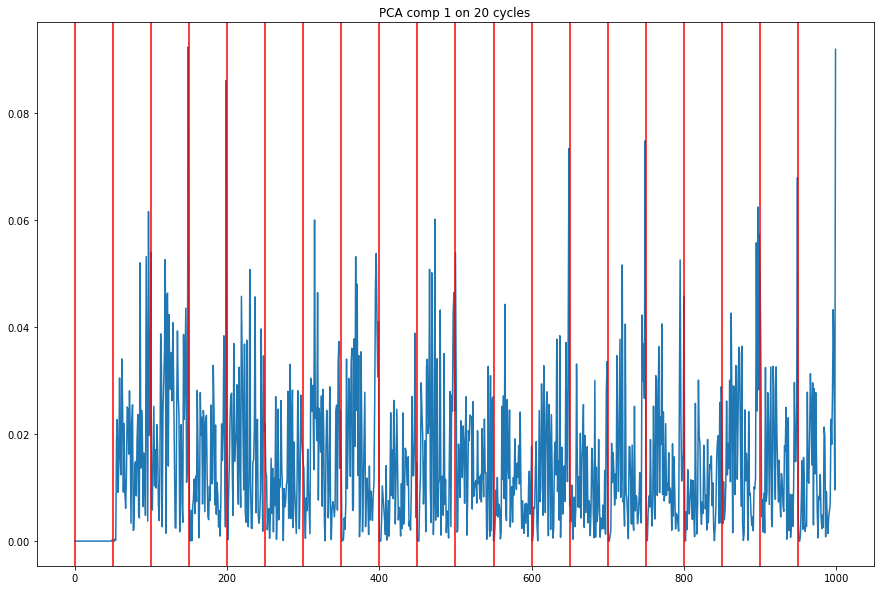

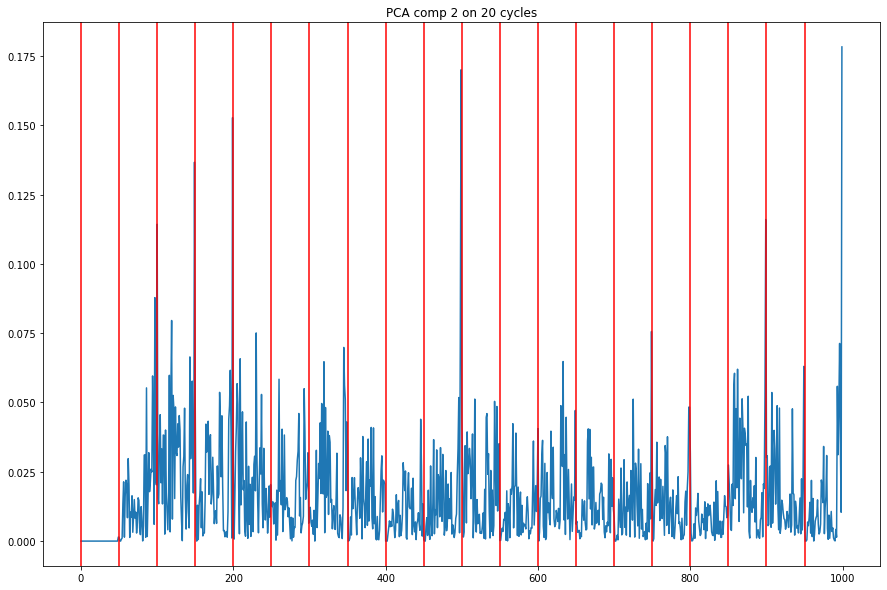

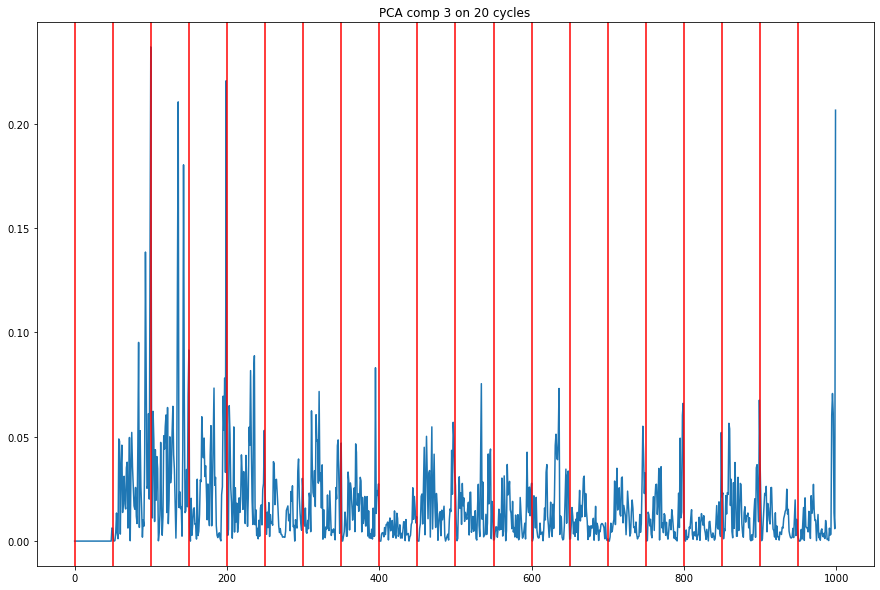

...

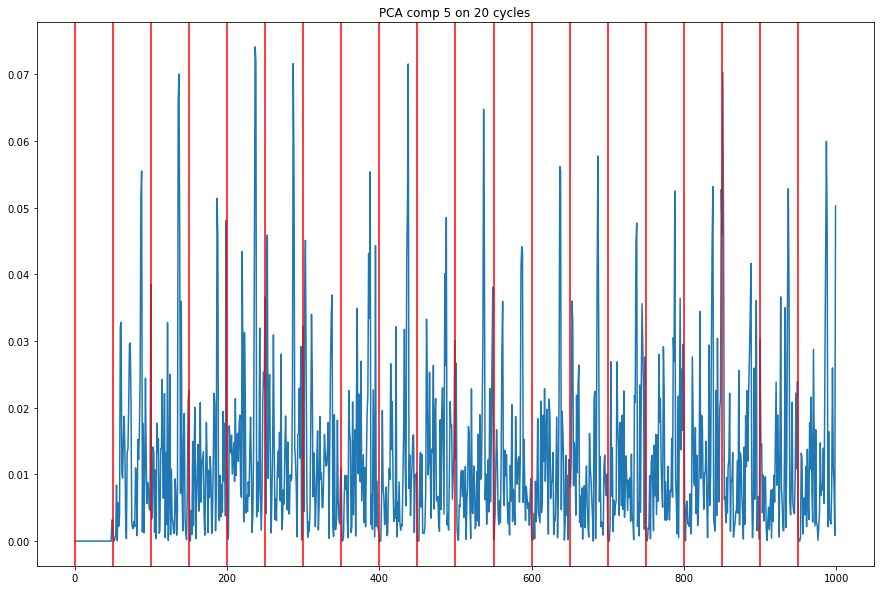

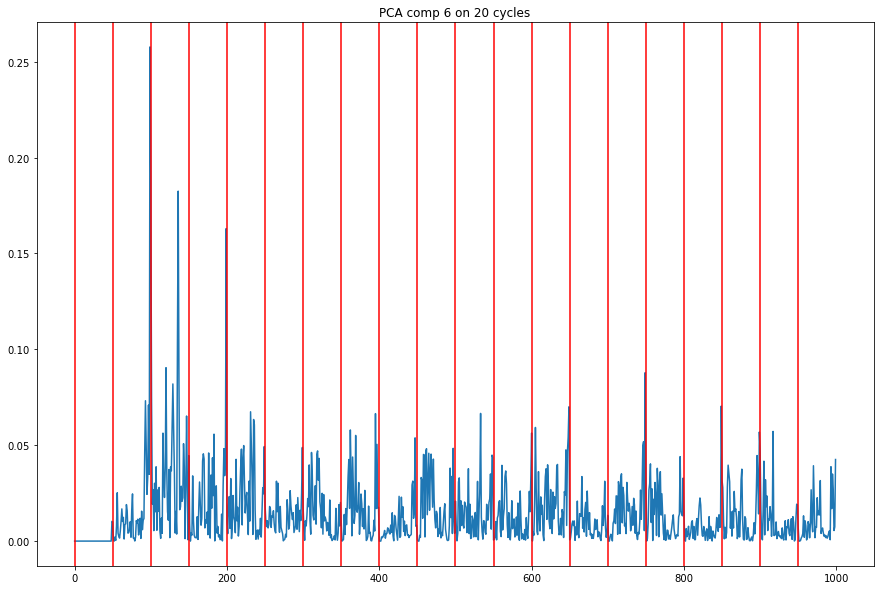

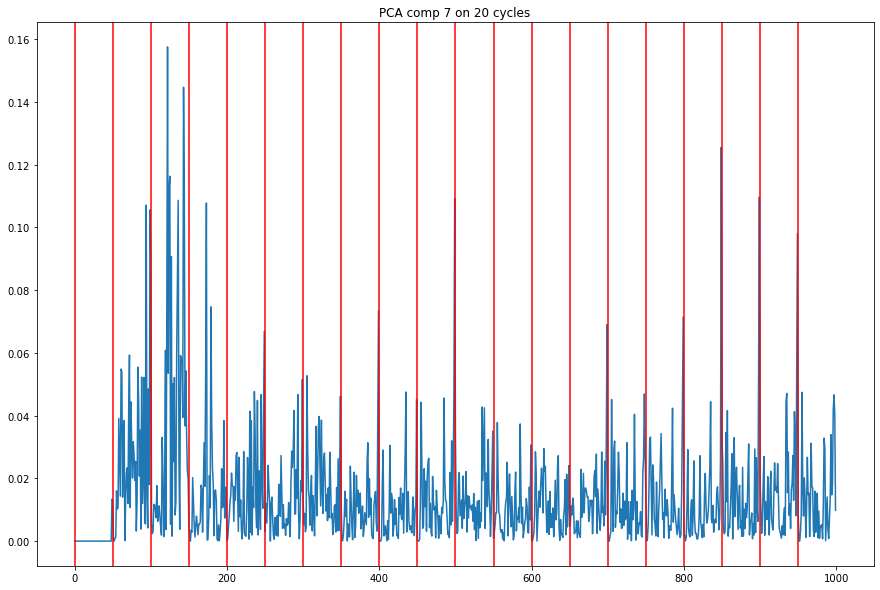

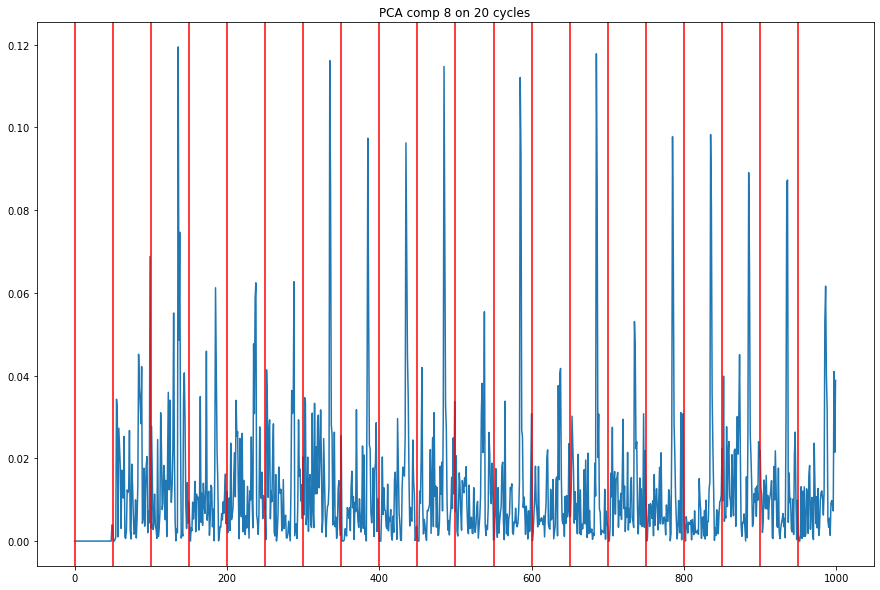

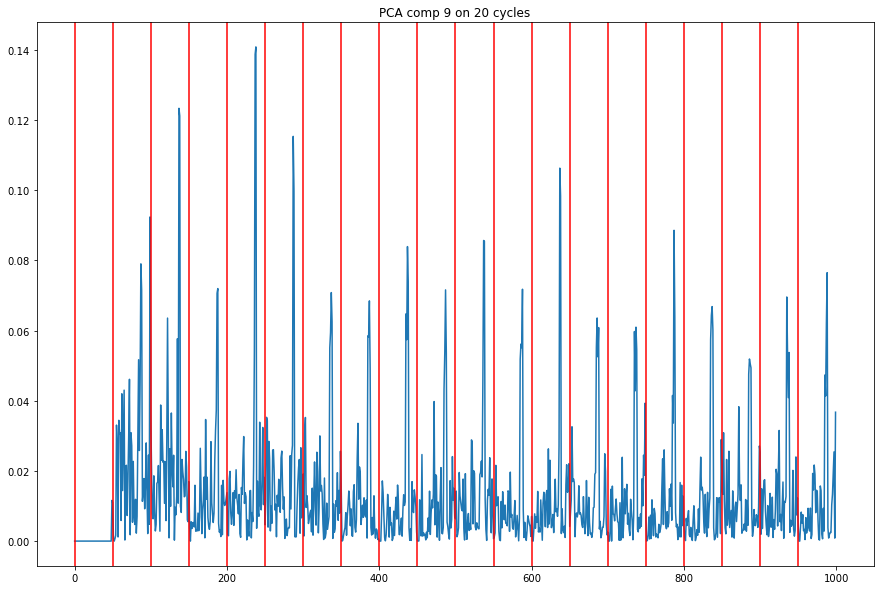

In [372]:
n_comp = 10

nb_cycles=20

from sklearn.decomposition import PCA

image_nav_for_PCA=image_nav__demod_centered_diff
plt.figure(figsize=(40,10))
plt.imshow(image_nav_for_PCA[:,:nb_cycles*nb_gating_spokes],cmap="gray")
for j in range(nb_cycles):
        plt.axvline(x=j*nb_gating_spokes,color="r")

pca = PCA(n_components=n_comp)
pca.fit(image_nav_for_PCA)


for comp in range(np.minimum(n_comp,10)):
    plt.figure(figsize=(15,10))
    plt.plot(np.abs(pca.components_[comp,:nb_cycles*nb_gating_spokes]))
    plt.title("PCA comp {} on {} cycles".format(comp,nb_cycles))
    for j in range(nb_cycles):
        plt.axvline(x=j*nb_gating_spokes,color="r")

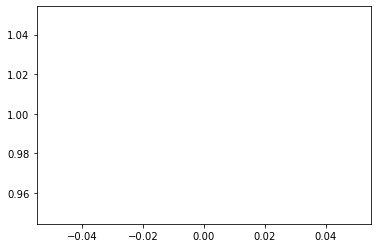

In [153]:
plt.plot(pca.explained_variance_ratio_)

Not using cupy in PCA transform


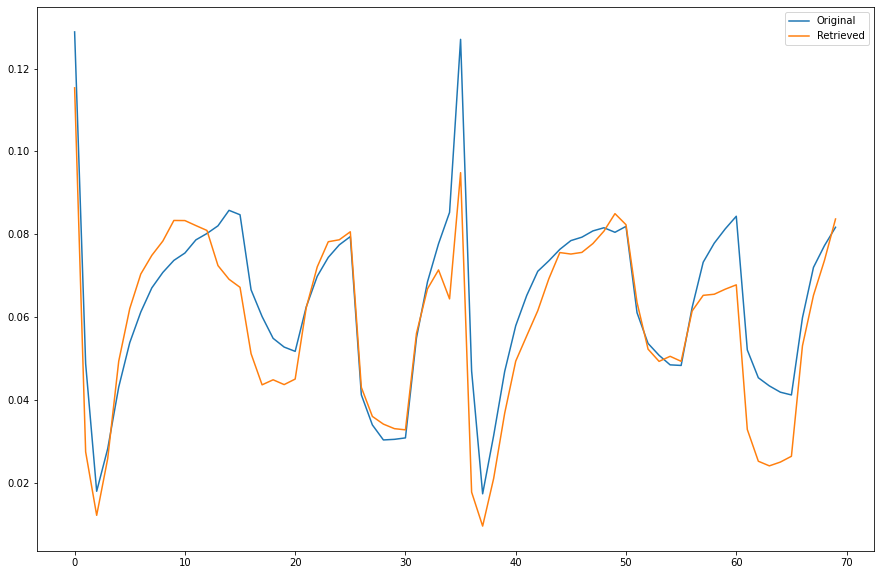

In [154]:
pca.plot_retrieved_signal(image_nav_for_PCA,i=200,len=2*nb_gating_spokes)

In [155]:
image_nav_trans = pca.transform(image_nav_for_PCA)
retrieved_image_nav = np.matmul(image_nav_trans,np.transpose(pca.components_))

Not using cupy in PCA transform


In [156]:
filtered_image = image_nav_for_PCA-retrieved_image_nav

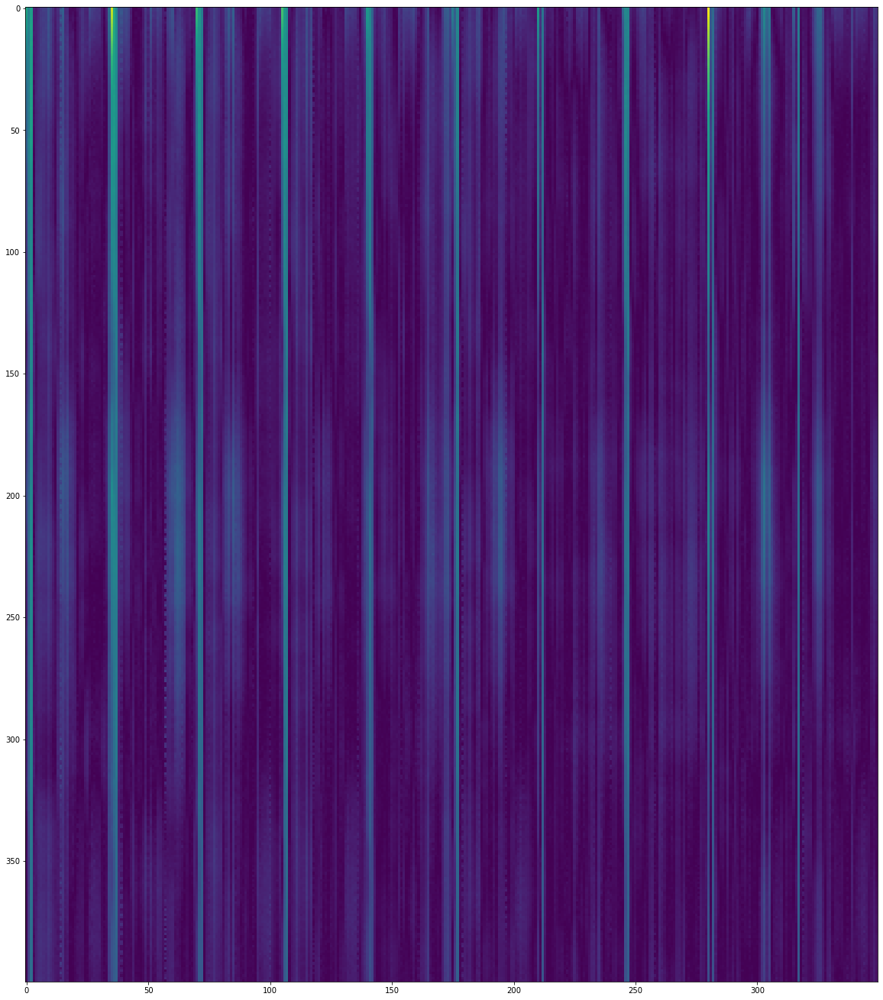

In [157]:
plt.figure(figsize=(20,30))

plt.imshow(np.abs(filtered_image)[:,:nb_cycles*nb_gating_spokes])

In [158]:
filtered_image.shape

(400, 1680)

In [159]:
np.diff(np.abs(filtered_image)[:,i*nb_gating_spokes:(i+1)*nb_gating_spokes],axis=-1).shape

(400, 34)

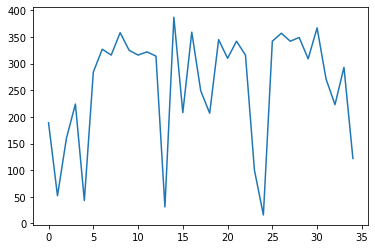

In [160]:
i=0
j=1
plt.plot(np.argmax(np.diff(np.abs(filtered_image)[:,i*nb_gating_spokes:(j)*nb_gating_spokes],axis=0),axis=0))


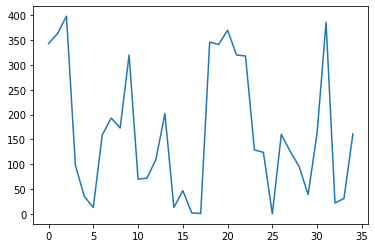

In [161]:
i=10
j=11
plt.plot(np.argmin(np.abs(filtered_image),axis=0)[i*nb_gating_spokes:(j)*nb_gating_spokes])


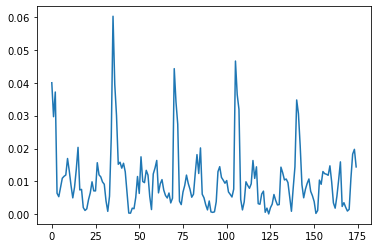

In [182]:
i=0
j=5
pixel=0
plt.plot(np.abs(filtered_image)[0,i*nb_gating_spokes:(j)*nb_gating_spokes])


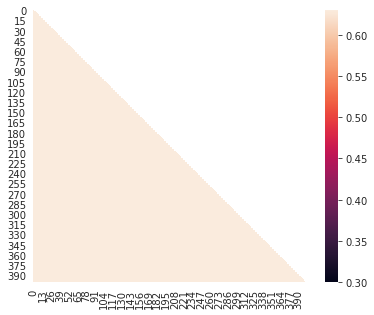

In [174]:
i=0
j=10

corr = np.corrcoef(np.abs(filtered_image[:,i*nb_gating_spokes:(j)*nb_gating_spokes]))
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(7, 5))
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)

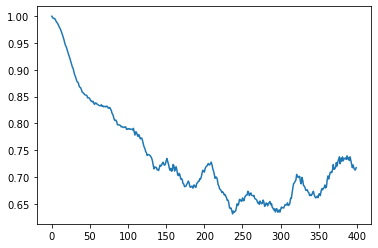

In [175]:
plt.plot(corr[0,:])

In [176]:
np.argmin(corr,axis=1)

array([237, 297, 297, 297, 299, 299, 299, 299, 299, 299, 299, 299, 299,
       299, 299, 299, 299, 299, 352, 352, 352, 352, 352, 352, 352, 352,
       352, 352, 352, 359, 359, 359, 359, 359, 359, 359, 359, 359, 359,
       359, 359, 359, 359, 359, 359, 359, 359, 359, 359, 359, 359, 357,
       359, 359, 357, 357, 359, 357, 357, 357, 359, 357, 357, 359, 359,
       357, 357, 359, 357, 357, 357, 357, 357, 357, 357, 357, 357, 357,
       357,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   

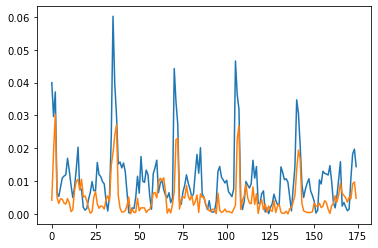

In [184]:
i=0
j=5
pixel=0
plt.plot(np.abs(filtered_image)[pixel,i*nb_gating_spokes:(j)*nb_gating_spokes])
pixel=297
plt.plot(np.abs(filtered_image)[pixel,i*nb_gating_spokes:(j)*nb_gating_spokes])


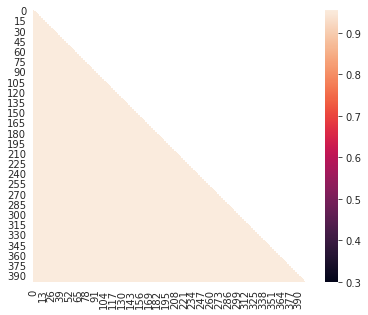

In [177]:
i=0
j=10

corr = np.corrcoef(np.abs(image_nav_for_PCA[:,i*nb_gating_spokes:(j)*nb_gating_spokes]))
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(7, 5))
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)

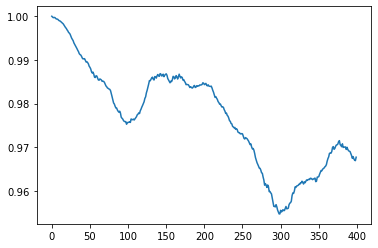

In [178]:
plt.plot(corr[0,:])

In [179]:
np.argmin(corr,axis=1)

array([298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298,
       298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298,
       310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310,
       310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310,
       310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310,
       310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310,
       310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310,
       310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310, 310,
       310, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298,
       298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298,
       298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298,
       298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 299, 298,
       298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 298, 299,
       298, 298, 298, 298, 298, 298, 298, 299, 298, 298, 298, 29

On each gating spoke to get rid of MRF modulation

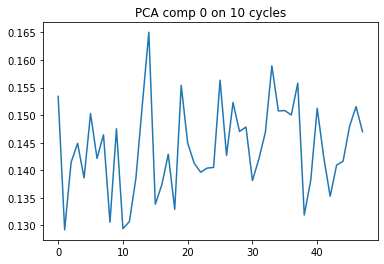

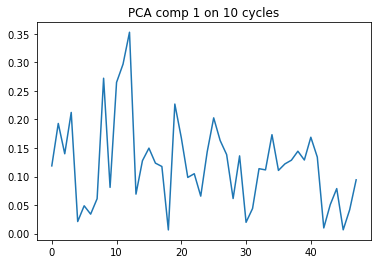

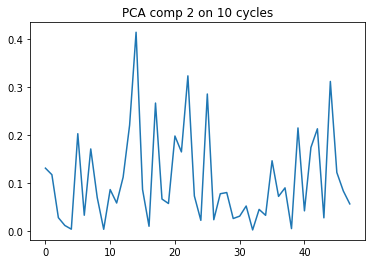

In [205]:

n_comp = 3
gating_spoke_no = 0

image_nav_spoke_for_PCA=images_series_rebuilt_nav[:,gating_spoke_no,:].T
pca = PCAComplex(n_components_=n_comp)
pca.fit(image_nav_spoke_for_PCA)

nb_cycles=10
for comp in range(np.minimum(n_comp,10)):
    plt.figure()
    plt.plot(np.abs(pca.components_[:nb_cycles*nb_gating_spokes,comp]))
    plt.title("PCA comp {} on {} cycles".format(comp,nb_cycles))


# b1 not None

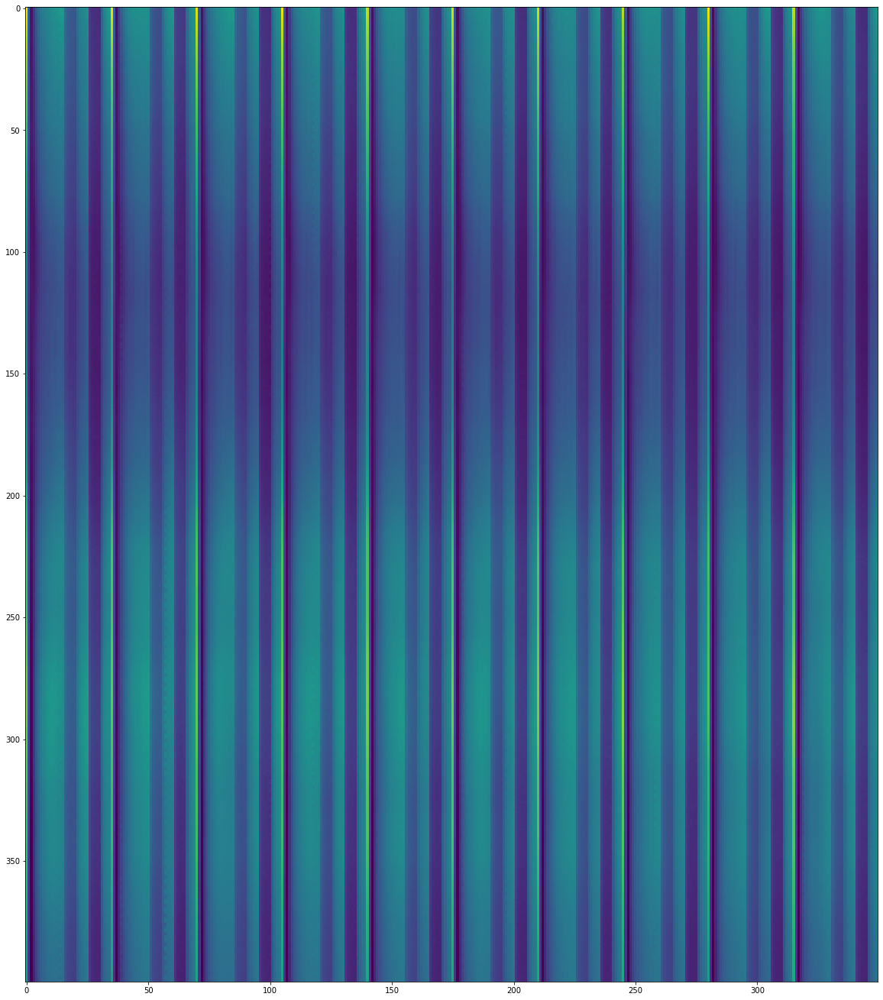

In [30]:

nb_cycles=10
plt.figure(figsize=(20,30))
plt.imshow(image_nav.reshape(-1,int(npoint/2))[:nb_cycles*nb_gating_spokes,:].T)


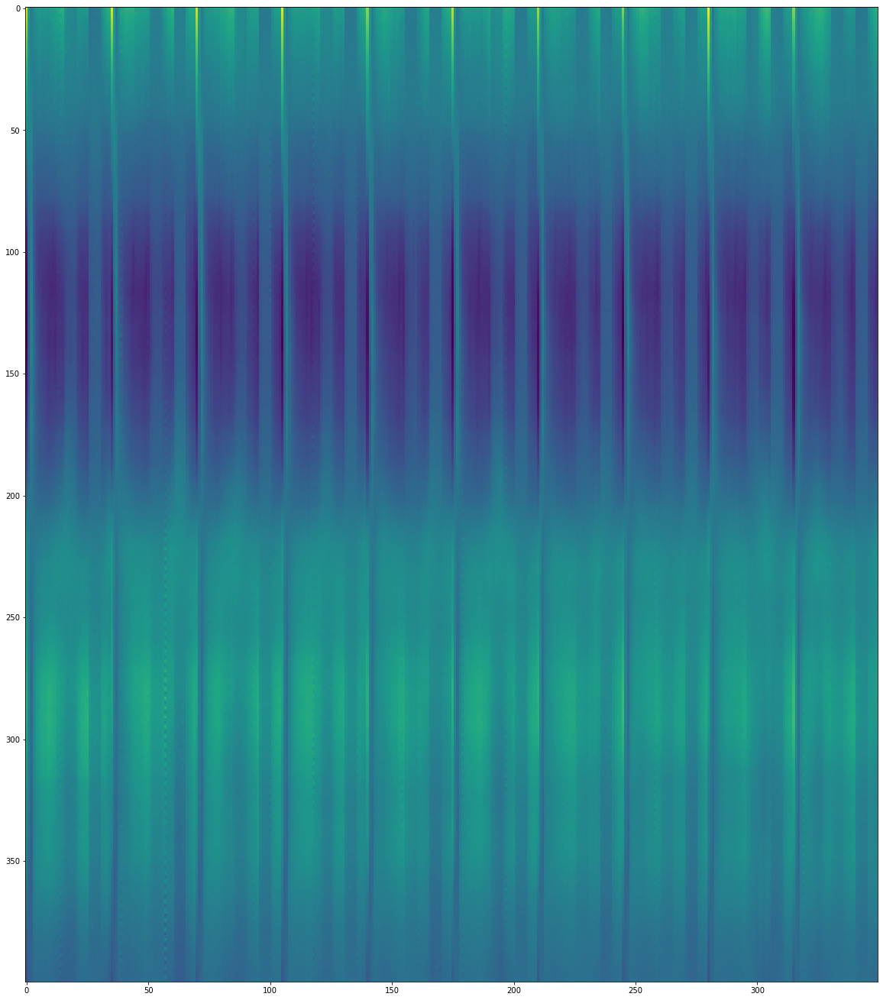

In [31]:

nb_cycles=10
plt.figure(figsize=(20,30))
mean = np.mean(image_nav.reshape(-1,int(npoint/2))[:nb_cycles*nb_gating_spokes,:],axis=-1)
plt.imshow(image_nav.reshape(-1,int(npoint/2))[:nb_cycles*nb_gating_spokes,:].T-mean)
